<a href="https://colab.research.google.com/github/hbakhshi/Analysis13TeV/blob/master/Copy_of_AI_Assited_WTC_Console.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CMS Workflow Failures Recovery Panel Towards AI-assisted Operation

    The central production system of CMS is utilizing the LHC grid and effectively about 200 thousand cores, over about a hundred computing centers worldwide. Such a wide and unique distributed computing system is bound to sustain a certain rate of failures of various types. These are appropriately addressed with site administrators a posteriori. With up to 50 different campaigns ongoing concurrently, the range of diversity of workload is wide and complex, leading to a certain amount of mis-configurations, despite all efforts in request preparation. Most of the 2000 to 4000 datasets produced each week are done so in full automation, and datasets are delivered within an agreed level of completion. Despite effort of reducing the rate of failure, there remains a good fraction of workflows that requires non trivial intervention. This work remains for computing operators to do.

    We present here a tool, which was developed to facilitate and improve this operation, in a view to reduce delays in delivery. A dense and comprehensive representation of what errors occurred during the processing of a request helps expediting the investigation. Workflows that suffered from similar failures are bundled and presented as such to the operator. A realistically simplified operating panel front-end is connected to a backend automatizing the technical operation required for ease of operation. The framework was built such that it is collecting both the decision and the information available to the operator for taking that decision. It is therefore possible to employ machine learning technique to learn from the operator by training on labelled data. The operator’s procedure is automatized further by applying the decisions that are predicted with acceptable confidence. We present this tool that improves operational efficiency and will lead to further development in handling failures in distributed computing resources using machine learning.

## Authenticate & access data

In [0]:
# Code to read csv file into colaboratory
!pip install -U -q PyDrive

In [0]:
# Load Google Drive CSV into Pandas DataFrame for Google Colaboratory
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [0]:
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
# Print out the files in a folder and their unique identifiers 
file_list = drive.ListFile({'q': 
                            "'1qu76CLU481p2byFYm6GL5qCNu3yNK2vL' in parents and trashed=false"}).GetList()
for file1 in file_list:
  print('title: %s, id: %s' % (file1['title'], file1['id']))

title: AI_Assited_WTC_Console.ipynb, id: 1tef-ORQPhkXgqre0DUfLG36bLYmyUY3H
title: Social_Network_Influencers.ipynb, id: 1G3r-R1vp-Cqd86qRaFnDkcen28GBYmjC
title: Image_Classification_with_MNIST.ipynb, id: 1unahF_X1QQNH2Ao_9wnP97PTub5doZCy
title: Copy of main_final.ipynb, id: 1Fkqb-7qClX6LA0YfgEdDBGIGZw9HSU62
title: Copy of main_final.ipynb, id: 1q9f7O1DEGB9gz3yYiWlJVYd8-Y46GOCj
title: Copy of main_final.ipynb, id: 1Nug8f931p_Lwto9wlzaWKvMP-N5KXC0j
title: Copy of main_final.ipynb, id: 1vQPM8rrHOjbN24W6CEOKKzegOSSDAb49
title: Copy of Hello, Colaboratory, id: 1-WuW5ZM-kQIrNYaFjvP4Cq4o6Um57-Wj
title: GenerativeAdversarialNetworks.ipynb, id: 1AlRFGg14oZKI9YCS1P2QPGDGP-kXWXYq
title: DESY_ML_School_2018_Keras_tutorial_solution.ipynb, id: 1DUPP67yj7ShvukQMdCamRxHK-Z049vJ1
title: DESY_ML_School_2018_Keras_tutorial_exercise.ipynb, id: 1Rk-mZ7jYuwEyBYet7ovksm_2sDs_Wcov
title: modeling_with_tensorflow.ipynb, id: 1vw5T33mtGGV6SXZMPqyuKblLzFobOs1C
title: DESY_ML_School_2018_Keras_tutorial.ipynb, id: 

In [0]:
# Set file IDs
history_180223_id = '1knTm9-PZC_h9ZqpB-ej8kJidVJ0YHSl3'
history_180412_id = '1qHVA81qCER3uKJlPQqfTLPeEIjt4qQ8q'

In [0]:
# Get the file
history_180223_downloaded = drive.CreateFile({'id': history_180223_id})
history_180223_downloaded.GetContentFile('history.180223.json')

history_180412_downloaded = drive.CreateFile({'id': history_180412_id})
history_180412_downloaded.GetContentFile('history.180412.json')

In [0]:
!ls 

adc.json  history.180223.json  history.180412.json  sample_data


## Download libraries

In [0]:
# Install several libraries
!pip install uproot
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install Cython
!pip install joblib
!pip install shap

# Install ML libraries
!pip install git+https://github.com/scikit-learn/scikit-learn.git#egg=scikit-learn --upgrade
!pip install keras
!pip install imblearn
!pip install mlxtend
#!pip install xgboost
!pip install --upgrade xgboost==0.71

# Install optimizer-libraries
!pip install hyperopt
!pip install bayesian-optimization
!pip install scikit-optimize

# Install graphics
!pip install pydot
!pip install graphviz

# Install personal ML tool kit
!pip install --upgrade --no-deps --force-reinstall git+https://github.com/chrisjcc/DataInsight.git#egg=DataInsight

    100% |████████████████████████████████| 143kB 6.6MB/s 
    100% |████████████████████████████████| 81kB 8.1MB/s 
    100% |████████████████████████████████| 133kB 5.9MB/s 
  Running setup.py bdist_wheel for lz4 ... - \ | / - \ | / - \ | / - done
  Stored in directory: /root/.cache/pip/wheels/9a/bf/d1/b771620d908af63302309490d1892224364bb541f8e84af67d
Successfully built lz4
    100% |████████████████████████████████| 2.1MB 10.5MB/s 
    100% |████████████████████████████████| 204kB 7.6MB/s 
  Running setup.py bdist_wheel for shap ... - \ | / done
  Stored in directory: /root/.cache/pip/wheels/3f/cb/58/2482f534eb1c1f9ac93653887aee5b6ea83718ef041c1310bd
Successfully built shap
  Cloning https://github.com/scikit-learn/scikit-learn.git to /tmp/pip-install-wiq85nuz/scikit-learn
  Running setup.py bdist_wheel for scikit-learn ... - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | /

## Import Libraries

In [0]:
## Import libraries

# ---- Import googles colab
from google.colab import files

# ---- Import basic library
import sys
import json
from collections import Counter  
import collections
import itertools
from itertools import chain
import pydot
import graphviz
import re

# ---- Import numpy library
import numpy
import numpy as np
from numpy import math
from numpy import argmax

# ---- Import Scipy library
from scipy.sparse import csr_matrix
from scipy import interp

# ---- Import pandas library
import pandas as pd

# ---- Import seaborn
import seaborn as sns

# ---- Import TensorFlow library
import tensorflow as tf

# ---- Import from matplotlib library
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

#---- Import XGBoost library
import xgboost

# ---- Import scikit-learn library
import sklearn
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.dummy import DummyClassifier
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import KFold, StratifiedKFold, ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
#from sklearn.metrics import confusion_matrix
from sklearn.metrics import log_loss
from sklearn.metrics import f1_score
from sklearn.metrics import make_scorer
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedShuffleSplit
#introduced recentl in version 0.20 release.
#from sklearn.preprocessing import CategoricalEncoder  
from sklearn import metrics
from itertools import cycle
from sklearn import preprocessing
from sklearn.preprocessing import label_binarize

# ---- Import Keras deep neural network library
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.regularizers import l1, l2 #,WeightRegularizer
from keras.constraints import maxnorm
from keras.models import model_from_json
from keras.optimizers import Adam
from keras.layers.normalization import BatchNormalization
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils.vis_utils import plot_model
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.utils import np_utils
from keras import backend as K
from keras import metrics

# ---- Import Imbalanced library
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.pipeline import Pipeline 
from imblearn.pipeline import make_pipeline as make_imb_pipeline
from imblearn.ensemble import BalancedBaggingClassifier 
from imblearn.metrics import geometric_mean_score
from imblearn.metrics import classification_report_imbalanced

# ---- Import Scikit-Learn Optimizer library
from skopt import gp_minimize, forest_minimize
from skopt.plots import plot_evaluations, plot_convergence, plot_objective#, plot_histogram
from skopt.space import Real, Integer, Categorical
from skopt.utils import use_named_args

# ----- Import Scipy library
from scipy.stats import ks_2samp

# ---- Import MLXtend library
from mlxtend.evaluate import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix

# ---- Import neural network modelling library
#from neural_network.models import DeepModel

# ---- Import optimization for hyper-parameter
#from neural_network.optimization import SkOptObjective

# ---- Import plotter library
from visualization.plotter import Plotter

# ---- Import Shap library
import shap

# ---- Import Warning library
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 


# ---- Fix random seed for reproducibility
seed = 42
numpy.random.seed(seed)
np.set_printoptions(precision=2)

Using TensorFlow backend.


In [0]:
# Define Multilayer Perceptron architecture
def create_model(input_dim=7342, n_classes = 11, nlayers=5, nneurons=100,
                 dropout_rate=0.0, l2_norm=0.001, learning_rate=1e-3,
                 activation='relu', kernel_initializer='lecun_normal',
                 optimizer='adam', metric=metrics.sparse_categorical_accuracy, 
                 loss='sparse_categorical_crossentropy'):
    '''
    create_model
    '''
        
    # create neural network model
    model = Sequential()
    
    # Add fully connected layer with an activation function (input layer)
    model.add(Dense(units=nneurons,
                    input_dim=input_dim,
                    kernel_initializer=kernel_initializer,
                    activation=activation,
                    kernel_regularizer=l2(l2_norm)))
    
    if dropout_rate != 0.:
        model.add(Dropout(dropout_rate))
                                        
    # Indicate the number of hidden layers
    for index, layer in enumerate(range(nlayers-1)):
        model.add(Dense(units=nneurons,
                        kernel_initializer=kernel_initializer,
                        activation=activation,
                        kernel_regularizer=l2(l2_norm)))
        
    # Add dropout layer
    if dropout_rate != 0.:
        model.add(Dropout(dropout_rate))
        
    # Add fully connected output layer with a sigmoid activation function
    model.add(Dense(n_classes,#1, #n_classes,
                    kernel_initializer=kernel_initializer,
                    activation='softmax',
                    kernel_regularizer=l2(l2_norm)))

    # Compile neural network (set loss and optimize)
    model.compile(loss=loss, #'binary_crossentropy', #loss,#'categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=[metric]) #'crossentropy'
    
    # Print summary report
    if True:
        model.summary()
    
    # Return compiled network
    return model

In [0]:
# Define several utility functions
def list_of_sites(x):
  sites = []
  if len(x) != 0:
      sites = [item.keys() for item in x]
  else:
      sites = ['NA']

  return sites
  
  
def build_table(df, site_name, exit_code):
  sparse_df = pd.DataFrame(columns=site_name,
                           index=exit_code).fillna(value=0).sort_index()

  if len(df.keys()) == 0 or len(df.values()) == 0:
    return sparse_df
    
  else:
    for exit_code, site_dict in zip(df.keys(), df.values()):
      #print exit_code, site_dict
      for site, count in site_dict.items():
        sparse_df.loc[exit_code, site] = 0 if math.isnan(count) else count
    
    return sparse_df


def build_table_flatten(x):
  d_outer = []
    
  for column in x: # 60 columns (i.e. sites)
      #d_outer.append([item for item in x[column]]) # 43 items
      for item in x[column]:
          d_outer.append(item)
    
  return d_outer


def combine_features(x, feature1, feature2):
  return x[feature1]+x[feature2]


def onehot(labels):
  Uniques, Index  = np.unique(labels,return_inverse=True)
  # Convert labels to categorical one-hot encoding
  # convert integers to dummy variables (i.e. one hot encoded)
  one_hot_labels = np_utils.to_categorical(Index,len(Uniques))
  return one_hot_labels


def inverse_onehot(matrix):
  labels =[]
  for row in matrix:
      labels.append(np.argmax(row,axis=0))
  return labels  


def xrootd_fnc(x, column):
  # if isinstance(x.keys(), dict): 
  if column in x.keys():
      return str(x[column])
    
  else:
      return str('NaN')


def splitting_fnc(x, column):
  if column in x.keys():
      return str(x[column])
        
  else:
      return str('1x')


def merge_labels(x, features):
  merged_label = '_'.join(x[features]) 

  return merged_label


def plot_class_count(x, feature):
  
  data = x[[feature]]
  print(data.groupby(feature).size())
  w, h = 15, 7
  plt.figure(figsize=(15,7))
  plt.tight_layout()
  
  ax = sns.countplot(x=feature, data=data)
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)
  ax.patch.set_facecolor('#FFFFFF')
  
  return plt.show()


def exit_code_counts(x, feature, title='good'):
  # transverse the workflow table (from exit code vs site to site vs exit code)
  df = x[feature].T.sum().T.sum()
  df_histo = df.to_dict()
  df_histo = collections.OrderedDict(sorted(df_histo.items()))

  ax = df.plot(kind='bar',
               stacked=True,
               figsize=(10,6),
               align='center')

  for container in ax.containers:
    plt.setp(container, width=1)

  width = 1.0

  pos = np.arange(len(df_histo.keys()))
  width = 1.     # gives histogram aspect to the bar diagram

  ax = plt.axes()
  ax.set_xticks(pos + (width / 2))
  ax.set_xticklabels(df_histo.keys())

  ax.patch.set_facecolor('#FFFFFF')
  x0, x1 = ax.get_xlim()
  ax.set_xlim(x0 -0.5, x1 + 0.25)
  ax.set_xlabel(title+"_site_exit_code")
  ax.set_ylabel("Count_exit_code")
  patches, labels = ax.get_legend_handles_labels()
  ax.legend(patches, labels, loc='best')
  plt.xticks(rotation='vertical')
  plt.tight_layout()
  
  return plt.show()


def extract_campaign(x):

    campaign = re.match(r'[^_]*_(task_)?.*?([^-_]*)(-\d*)?_.*', x['index']).group(2)

    return campaign


def plot_campaign_exit_codes(campaign_name = "RunIISummer17DRPremix", 
                             exit_code_feature='errors_good_sites_exit_codes'):

  # flatten list of tuples containing exit codes
  lst = data_index_reset.query('campaign == @campaign_name')[exit_code_feature]
  lst = [list(x) for x in lst]

  result= list(itertools.chain(*lst))
  
  campaign_exit_code_counts = Counter(elem for elem in result)
  campaign_exit_code_counts = collections.OrderedDict(sorted(campaign_exit_code_counts.items(), 
                                                             key=lambda s: s[0]))
  
  # gives histogram aspect to the bar diagram
  width = 1.0     
  
  #Accent, Accent_r, Blues, Blues_r, BrBG, BrBG_r, BuGn, BuGn_r, BuPu, BuPu_r, 
  #stab10, tab10_r, tab20, tab20_r, tab20b, 

  # plot exit codes occurrences
  ax = pd.DataFrame.from_dict(campaign_exit_code_counts, 
                              orient='index').plot(kind='bar',
                                                   colormap=plt.cm.get_cmap('tab20'),
                                                   #stacked=True,
                                                   figsize=(10,6),
                                                   align='center')

  #ax = plt.axes()
  
  for container in ax.containers:
    plt.setp(container, width=1)
    
  pos = np.arange(len(campaign_exit_code_counts.keys()))

  ax.set_xticks(pos + (width / 2))

  ax.patch.set_facecolor('#FFFFFF')
  ax.set_xlabel("Site_exit_code")
  ax.set_ylabel("Exit_code_count")
  patches, labels = ax.get_legend_handles_labels()

  
  patch = mpatches.Patch(color='#3774B1',#'tab:blue', 
                         label=str(campaign_name))
  plt.title('Exit code histogram of campaign: '+str(campaign))
  plt.legend(handles=[patch], title="campaign",
             fontsize='small', fancybox=True)
  
  ax.set_xticklabels(campaign_exit_code_counts.keys(), rotation=45)
  plt.tight_layout()
  plt.savefig("datalab/"+str(campaign_name)+'_'+str(exit_code_feature)+'.png', 
              bbox_inches='tight')
  
  return plt.show()


def categorical_crossentropy_loss(y_true, y_pred):
  # converg predicted and true y targets ndarray into tensorflow tensor objects
  y_true = tf.convert_to_tensor(inverse_onehot(y_true), dtype=tf.float64)
  y_pred = tf.convert_to_tensor(y_pred, dtype=tf.float64)

  # calculate categorical crossy entropy (log-loss)
  score = K.categorical_crossentropy(y_true, y_pred).eval(session=K.get_session())
  #K.clear_session()

  # check score value is not NaN
  if math.isnan(score) or not isinstance(score, float):
      score = 1.0e7
  #print('categorical_crossentropy', score)
    
  return score


def log_loss_fn(y_true, y_pred, 
                labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]):
  return log_loss(inverse_onehot(y_true), y_pred.tolist(), eps=1e-15, 
                  labels=labels)


def neg_log_loss(y_true, y_pred,
                 labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]):
  return log_loss(y_true, y_pred, eps=1e-15, labels=labels)


def f1_score_objective(y_true, y_pred,
                       labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                       average='weighted',
                       sample_weight=None):
  return f1_score(y_true, y_pred, labels=labels,
                  average=average, sample_weight=sample_weight)


def geometric_mean(y_true, y_pred, average='weighted', #'multiclass'
                   labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], 
                   sample_weight=None, correction=0.0):
  return geometric_mean_score(y_true, y_pred, labels=labels, average=average, 
                              sample_weight=sample_weight, correction=correction)

## Define ROC curve plot
def roc_curve(estimators, X_train, X_test, y_train, y_test):
  """Roc curve metric plotter.
        
  Parameters
  ----------
  models : dictionary, shape = [n_models]
  X : DataFrame, shape = [n_samples, n_classes]
  y : DataFrame, shape = [n_classes]

  Returns
  -------
  roc : matplotlib plot
  """

  models = estimators

  # contains rates for ML classifiers
  fpr = {}
  tpr = {}
  roc_auc = {}
    
  # Customize the major grid
  fig, ax = plt.subplots()
  ax.grid(which='major', linestyle='-', linewidth='0.2', color='gray')
  ax.patch.set_facecolor('white')
    
  # Include random by chance 'luck' curve
  plt.plot([0, 1], [0, 1], '--', color=(0.1, 0.1, 0.1), label='Luck')
        
  # Loop through classifiers
  for (name, model) in models.items():
    
    print("\n\x1b[1;31mBuilding model ...\x1b[0m")
    model.fit(X_train, y_train)
    
    y_predicted = model.predict(X_test)
    
    if hasattr(model, "predict_proba"):
        decisions = model.predict_proba(X_test)[:, 1]
    else:  # use decision function
        decisions = model.decision_function(X_test)

    print("\tArea under ROC curve for %s: %.4f"%(name, roc_auc_score(y_test, 
                                                                     decisions, 
                                                                     average='weighted')))
        
    
    # Calculate the area under the ROC curve
    lb = preprocessing.LabelBinarizer()
    y_train = lb.fit_transform(y_train)
    y_test = lb.transform(y_test)
    fpr[name], tpr[name], thresholds = sklearn.metrics.roc_curve(y_test,
                                                                 decisions,
                                                                 pos_label=1
                                                                )

    # Configure AUC ROC per ML classifiers
    roc_auc[name] = sklearn.metrics.auc(fpr[name], tpr[name])
    
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue',
                    'green', 'yellow', 'SlateBlue', 'DarkSlateGrey',
                    'CadetBlue', 'Chocolate', 'darkred', 'GoldenRod'])
  
    for (name, model), color in zip(models.items(), colors):
      
      plt.plot(fpr[name], tpr[name],
               color=color, lw=2,
               label='%s (AUC = %0.3f)'%(name, roc_auc[name]))                 
    
    # Plot all ROC curves
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title("Receiver operating characteristic ({} events)".format(X_train.shape[0]+X_test.shape[0]))
    #plt.title("Receiver operating characteristic ({} events)".format(X_test.shape[0]))
    leg = plt.legend(loc="lower right", frameon=True, fancybox=True, fontsize=8) # loc='best'
    leg.get_frame().set_edgecolor('w')
    frame = leg.get_frame()
    frame.set_facecolor('White')
    
    return plt.show()
  
  ## Define Cross-validated ROC curve plot
def roc_curve_cv(estimators, X, y, n_splits=15, folds_included=False):
    """Cross-validated Roc curve metric plotter.

    Source: http://scikit-learn.org/stable/auto_examples/model_selection/
    plot_roc_crossval.html

    Parameters
    ----------
    models : dictionary, shape = [n_models]
    X : DataFrame, shape = [n_samples, n_classes]
    y : DataFrame, shape = [n_classes]
    
    Returns
    -------
    roc : matplotlib plot
    """

    # Classification and ROC analysis
    classifier = estimators

    # Run classifier with cross-validation and plot ROC curves
    cv = StratifiedKFold(n_splits=n_splits)

    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
        
    # Customize the major grid
    fig, ax = plt.subplots()
    ax.grid(which='major', linestyle='-', linewidth='0.2', color='gray')
    ax.patch.set_facecolor('white')

    i = 0
    for train, test in cv.split(X, y):
        probas_ = classifier.fit(X[train], y[train]).predict_proba(X[test])
        # Compute ROC curve and area the curve
        lb = preprocessing.LabelBinarizer()
        y = lb.fit_transform(y)
        fpr, tpr, thresholds = sklearn.metrics.roc_curve(y[test], 
                                                 probas_[:, 1], 
                                                 pos_label=1
        )
        tprs.append(interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = sklearn.metrics.auc(fpr, tpr)
        aucs.append(roc_auc)
        if folds_included == True:
            plt.plot(fpr, tpr, lw=1, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' 
                     % (i, roc_auc))
        i += 1
    
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
             label='Luck', alpha=.8)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = sklearn.metrics.auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    plt.plot(mean_fpr, mean_tpr, color='b',
             label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f) %s-fold' % (mean_auc, 
                                                                    std_auc, 
                                                                    n_splits),
             lw=2, alpha=.8)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                     label=r'$\pm$ 1 std. dev.')

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title("Receiver operating characteristic ({} events)".format(X.shape[0]))
    leg = plt.legend(loc="lower right", frameon=True, fancybox=True, fontsize=8) # loc='best'
    leg.get_frame().set_edgecolor('w')
    frame = leg.get_frame()
    frame.set_facecolor('White')    

    return plt.show()
  

def overfitting(estimator, X_train, X_test, y_train, y_test, bins=50):
  """                                                                                                                                 
  Multi class version of Logarithmic Loss metric                                                                                      
  Parameters                                                                                                                          
  ----------                                                                                                                          
  y_true : array, shape = [n_samples]                                                                                                 
  true class, intergers in [0, n_classes - 1)                                                                                         
  y_pred : array, shape = [n_samples, n_classes]                                                                                      
  Returns                                                                                                                             
  -------                                                                                                                             
  loss : float                                                                                                                        
  """
  # copy model to mimic pass-by value
  model = estimator

  # check to see if model is a pipeline object or not
  if isinstance(model, sklearn.pipeline.Pipeline):
    data_type = type(model._final_estimator)
  else:
    data_type = type(model)
      
  name = filter(str.isalnum, str(data_type).split(".")[-1])
    
  # check to see if model file exist
  model.fit(X_train, y_train)
    
  # use subplot to extract axis to add ks and p-value to plot
  fig, ax = plt.subplots(figsize=(8, 6))

  # Customize the major grid
  ax.grid(which='major', linestyle='-', linewidth='0.2', color='gray')
  ax.set_facecolor('white')
    
  if not hasattr(model, 'predict_proba'): # use decision function 
    d = model.decision_function(sp.sparse.vstack([X_train, X_test]))
    bin_edges_low_high = np.linspace(min(d), max(d), bins + 1)
  else: # use prediction function 
      bin_edges_low_high = np.linspace(0., 1., bins + 1)

      
  #lb = preprocessing.LabelBinarizer()
  #y_train = lb.fit_transform(y_train)
  #y_test = lb.transform(y_test)
  #print(y_test)
  
  label_name = ""
  y_scores = []
  for X, y in [(X_train, y_train), (X_test, y_test)]:
      
    if hasattr(model, 'predict_proba'):
      label_name = 'Prediction Probability'
      y_scores.append(model.predict_proba(X[y > 0])[:, 1])
      y_scores.append(model.predict_proba(X[y < 1])[:, 1])
    else:
      label_name = 'Decision Function'
      y_scores.append(model.decision_function(X[y > 0]))
      y_scores.append(model.decision_function(X[y < 1]))

  width = np.diff(bin_edges_low_high)
  # Signal training histogram
  #np.set_printoptions(threshold='nan')
  hist_sig_train, bin_edges = np.histogram(y_scores[0], bins=bin_edges_low_high)
  hist_sig_train = hist_sig_train / np.sum(hist_sig_train, dtype=np.float32)
    
  plt.bar(bin_edges[:-1], hist_sig_train, width=width, color='r', alpha=0.5,
          label='signal (train)')

  # Background training histogram                                                                                                     
  hist_bkg_train, bin_edges = np.histogram(y_scores[1], bins=bin_edges_low_high)
  hist_bkg_train = hist_bkg_train / np.sum(hist_bkg_train, dtype=np.float32)

  plt.bar(bin_edges[:-1], hist_bkg_train, width=width,
          color='steelblue', alpha=0.5, label='background (train)')
    
  # Signal test histogram                                                                                                             
  hist_sig_test, bin_edges = np.histogram(y_scores[2], bins=bin_edges_low_high)
        
  hist_sig_test = hist_sig_test / np.sum(hist_sig_test, dtype=np.float32)
  scale = len(y_scores[2]) / np.sum(hist_sig_test, dtype=np.float32)
  err = np.sqrt(hist_sig_test * scale) / scale

  plt.errorbar(bin_edges[:-1], hist_sig_test, yerr=err, fmt='o',
               c='r', label='signal (test)')

  # Background test histogram                                                                                                         
  hist_bkg_test, bin_edges = np.histogram(y_scores[3], bins=bin_edges_low_high)

  hist_bkg_test = hist_bkg_test / np.sum(hist_bkg_test, dtype=np.float32)
  scale = len(y_scores[3]) / np.sum(hist_bkg_test, dtype=np.float32)
  err = np.sqrt(hist_bkg_test * scale) / scale

  plt.errorbar(bin_edges[:-1], hist_bkg_test, yerr=err, fmt='o',
               c='steelblue', #range=low_high,                                      
               label='background (test)')
        
  # Estimate ks-test and p-values as an indicator of overtraining of fit model                                                        
  s_ks, s_pv = ks_2samp(hist_sig_test, hist_sig_train)
  b_ks, b_pv = ks_2samp(hist_bkg_test, hist_bkg_train)
        
        
  ax.set_title("%s: sig (bkg)\nks: %0.3f (%0.3f)\np-value: %0.3f (%0.3f)"
               % (name, s_ks, b_ks, s_pv, b_pv), fontsize=14)

  plt.xlabel(label_name)
  plt.ylabel('Arbitrary units')

  leg = plt.legend(loc='best', frameon=False, fancybox=False, fontsize=12)
  leg.get_frame().set_edgecolor('w')

  frame = leg.get_frame()
  frame.set_facecolor('White')

  return plt.show()  
  
  
def callbacks_list(filepath = "weights-improvement-{epoch:02d}-{loss:.4f}-best.hdf5"):
  
  model_checkpoint = ModelCheckpoint(
      filepath, 
      monitor=['loss', 'val_loss'], 
      verbose=1,        
      save_best_only=True,        
      mode='min')    

  callbacks_list = [model_checkpoint] 
  
  return callbacks_list

In [0]:
def weighted_categorical_crossentropy(weights):
    """
    A weighted version of keras.objectives.categorical_crossentropy
    
    Variables:
        weights: numpy array of shape (C,) where C is the number of classes
    
    Usage:
        weights = np.array([0.5,2,10]) # Class one at 0.5, class 2 twice the normal weights, class 3 10x.
        loss = weighted_categorical_crossentropy(weights)
        model.compile(loss=loss,optimizer='adam')
    """
    
    weights = K.variable(weights)
        
    def loss(y_true, y_pred):
        # scale predictions so that the class probas of each sample sum to 1
        y_pred /= K.sum(y_pred, axis=-1, keepdims=True)
        # clip to prevent NaN's and Inf's
        y_pred = K.clip(y_pred, K.epsilon(), 1 - K.epsilon())
        # calc
        loss = y_true * K.log(y_pred) * weights
        loss = -K.sum(loss, -1)
        return loss
    
    return loss

In [0]:
# Use model check point to store model weights
callbacks_list = callbacks_list()

# Use early stopping on training when the validation loss isn't decreasing anymore
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1)

# Preprocessing using 0-1 scaling by removing the mean and scaling to unit variance 
scaler = RobustScaler()

In [0]:
# Declare plotter 
plotter = Plotter()

In [0]:
# Now the files get pulled into Google Colab, GetContentFile saves the 
# files in the local environment and sets the names of the files.

# Set of available input files
input_filenames = ['history.180412.json', 'history.180223.json',
                   'history.171102.json', 'poolview_totals.json']
data = pd.read_json(input_filenames[0], orient='index')

In [0]:
# Check table, shape, size, and dimension
display(data.head())
print(type(data))
print("Dataset has {} entries and {} features".format(*data.shape))
print(data.size) # size = shape*ndim
print(data.ndim)

,errors,parameters
/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug17_8029_170915_163250_8451/DataProcessing/DataProcessingMergeAODoutput,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm..."
/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug17_8029_170915_163250_8451/DataProcessing/DataProcessingMergeMINIAODoutput,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm..."
/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug17_8029_170915_163250_8451/DataProcessing/DataProcessingMergeSKIMStreamBPHSkim,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm..."
/amaltaro_task_BTV-RunIISummer17DRPremix-00045__v1_T_170915_163255_3714/BTV-RunIISummer17DRPremix-00045_0,"{'good_sites': {'50660': {'T1_RU_JINR': 1}, '5...","{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1..."
/amaltaro_task_BTV-RunIISummer17DRPremix-00045__v1_T_170915_163255_3714/BTV-RunIISummer17DRPremix-00045_0/BTV-RunIISummer17DRPremix-00045_1,{'good_sites': {'50660': {'T2_CH_CERN_HLT': 15...,"{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1..."


<class 'pandas.core.frame.DataFrame'>
Dataset has 7582 entries and 2 features
15164
2


In [0]:
# Rest index
data_index_reset = data.reset_index()

In [0]:
data['errors'].head()

/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug17_8029_170915_163250_8451/DataProcessing/DataProcessingMergeAODoutput                            {'good_sites': {}, 'bad_sites': {'-1': {'T3_US...
/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug17_8029_170915_163250_8451/DataProcessing/DataProcessingMergeMINIAODoutput                        {'good_sites': {}, 'bad_sites': {'-1': {'T3_US...
/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug17_8029_170915_163250_8451/DataProcessing/DataProcessingMergeSKIMStreamBPHSkim                    {'good_sites': {}, 'bad_sites': {'-1': {'T3_US...
/amaltaro_task_BTV-RunIISummer17DRPremix-00045__v1_T_170915_163255_3714/BTV-RunIISummer17DRPremix-00045_0                                      {'good_sites': {'50660': {'T1_RU_JINR': 1}, '5...
/amaltaro_task_BTV-RunIISummer17DRPremix-00045__v1_T_170915_163255_3714/BTV-RunIISummer17DRPremix-00045_0/BTV-RunIISummer17DRPremix-00045_1    {'good_sites': {'50660': {'T2_CH_CERN_HLT': 15...
Name: errors, dtype: object

In [0]:
# Add column with list of exit code for good/bad sites
data_index_reset['errors_good_sites_exit_codes'] = data_index_reset['errors'].apply(lambda x: [*x['good_sites']] if len(x['good_sites'].keys()) != 0 else ['0'])

data_index_reset['errors_bad_sites_exit_codes'] = data_index_reset['errors'].apply(lambda x: [*x['bad_sites']] if len(x['bad_sites'].keys()) != 0 else ['0'])


In [0]:

data_index_reset['errors_good_sites_exit_codes'].head()

0                   [0]
1                   [0]
2                   [0]
3    [50660, 50664, -1]
4           [50660, -1]
Name: errors_good_sites_exit_codes, dtype: object

In [0]:
# Add column of dictionary with a list of good/bad sites
data_index_reset['errors_good_sites_dict'] = data_index_reset['errors'].apply(lambda x: [*x['good_sites'].values()] if len(x['good_sites'].values()) !=0 else [{'NA': 0}])

data_index_reset['errors_bad_sites_dict'] = data_index_reset['errors'].apply(lambda x: [*x['bad_sites'].values()] if len(x['bad_sites'].values()) !=0 else [{'NA': 0}])

In [0]:
data_index_reset['errors_good_sites_dict'].head()

0                                          [{'NA': 0}]
1                                          [{'NA': 0}]
2                                          [{'NA': 0}]
3    [{'T1_RU_JINR': 1}, {'T1_US_FNAL': 1}, {'T1_US...
4    [{'T2_CH_CERN_HLT': 15, 'T1_US_FNAL': 36, 'T1_...
Name: errors_good_sites_dict, dtype: object

In [0]:
# Add column of list of good/bad sites
data_index_reset['errors_good_sites_list'] = data_index_reset['errors_good_sites_dict'].apply(lambda x:  list_of_sites(x))

data_index_reset['errors_bad_sites_list'] = data_index_reset['errors_bad_sites_dict'].apply(lambda x:  list_of_sites(x))

In [0]:
data_index_reset['errors_good_sites_list'].head()

0                                               [(NA)]
1                                               [(NA)]
2                                               [(NA)]
3    [(T1_RU_JINR), (T1_US_FNAL), (T1_US_FNAL, T1_R...
4    [(T2_CH_CERN_HLT, T1_US_FNAL, T1_RU_JINR), (T2...
Name: errors_good_sites_list, dtype: object

In [0]:
# Exit code based on good_sites
list2d = data_index_reset['errors_good_sites_exit_codes'].tolist()
good_sites_exit_codes = sorted(set(list(itertools.chain.from_iterable(list2d))),key=int)
good_sites_exit_codes = [str(x) for x in good_sites_exit_codes]

In [0]:
# Sanity check
print(len(good_sites_exit_codes))
print(type(good_sites_exit_codes))
print(good_sites_exit_codes)

48
<class 'list'>
['-1', '0', '1', '53', '70', '71', '73', '75', '76', '80', '84', '85', '86', '87', '92', '132', '134', '135', '136', '137', '139', '143', '8001', '8002', '8003', '8004', '8026', '11003', '50115', '50513', '50660', '50661', '50664', '60307', '60405', '60450', '61202', '70318', '70452', '71302', '71304', '71305', '99109', '99303', '99400', '99401', '99996', '99999']


In [0]:
# Extract exit code based on bad_sites
list2d = data_index_reset['errors_bad_sites_exit_codes'].tolist()
bad_sites_exit_codes = sorted(set(list(itertools.chain.from_iterable(list2d))),key=int)
bad_sites_exit_codes = [str(x) for x in bad_sites_exit_codes]

In [0]:
# Sanity check
print(len(bad_sites_exit_codes))
print(type(bad_sites_exit_codes))
print(bad_sites_exit_codes)

41
<class 'list'>
['-1', '0', '53', '70', '73', '76', '80', '84', '85', '86', '87', '92', '134', '137', '139', '8001', '8002', '8003', '8026', '11003', '50115', '50513', '50660', '50661', '50664', '60450', '61202', '70452', '71101', '71102', '71104', '71302', '71303', '71304', '71305', '99109', '99303', '99305', '99400', '99401', '99999']


In [0]:
# Extract site names from good sites 
list2d_step1 = data_index_reset['errors_good_sites_list'].tolist()
list2d_step2 = list(itertools.chain.from_iterable(list2d_step1))
good_site_names = sorted(set(list(itertools.chain.from_iterable(list2d_step2))))
good_site_names = [str(x) for x in good_site_names]

In [0]:
# Sanity check
print(len(good_sites_exit_codes))
print(len(good_site_names))
print(good_site_names)

48
62
['NA', 'T0_CH_CERN', 'T1_DE_KIT', 'T1_ES_PIC', 'T1_FR_CCIN2P3', 'T1_IT_CNAF', 'T1_RU_JINR', 'T1_UK_RAL', 'T1_US_FNAL', 'T2_AT_Vienna', 'T2_BE_IIHE', 'T2_BE_UCL', 'T2_BR_SPRACE', 'T2_CH_CERN', 'T2_CH_CERN_HLT', 'T2_CH_CSCS', 'T2_CH_CSCS_HPC', 'T2_CN_Beijing', 'T2_DE_DESY', 'T2_DE_RWTH', 'T2_EE_Estonia', 'T2_ES_CIEMAT', 'T2_ES_IFCA', 'T2_FI_HIP', 'T2_FR_CCIN2P3', 'T2_FR_GRIF_IRFU', 'T2_FR_GRIF_LLR', 'T2_FR_IPHC', 'T2_GR_Ioannina', 'T2_HU_Budapest', 'T2_IN_TIFR', 'T2_IT_Bari', 'T2_IT_Legnaro', 'T2_IT_Pisa', 'T2_IT_Rome', 'T2_KR_KISTI', 'T2_KR_KNU', 'T2_PL_Swierk', 'T2_PL_Warsaw', 'T2_PT_NCG_Lisbon', 'T2_RU_IHEP', 'T2_RU_INR', 'T2_RU_ITEP', 'T2_RU_JINR', 'T2_TR_METU', 'T2_TW_NCHC', 'T2_UA_KIPT', 'T2_UK_London_Brunel', 'T2_UK_London_IC', 'T2_UK_SGrid_Bristol', 'T2_UK_SGrid_RALPP', 'T2_US_Caltech', 'T2_US_Florida', 'T2_US_MIT', 'T2_US_Nebraska', 'T2_US_Purdue', 'T2_US_UCSD', 'T2_US_Vanderbilt', 'T2_US_Wisconsin', 'T3_UK_London_RHUL', 'T3_UK_SGrid_Oxford', 'T3_US_NERSC']


In [0]:
# Extract site names from bad sites
list2d_step1 = data_index_reset['errors_bad_sites_list'].tolist()
list2d_step2 = list(itertools.chain.from_iterable(list2d_step1))
bad_site_names = sorted(set(list(itertools.chain.from_iterable(list2d_step2))))
bad_site_names = [str(x) for x in bad_site_names]

In [0]:
# Sanity check
print(len(bad_sites_exit_codes))
print(len(bad_site_names))
print(bad_site_names)

41
122
['NA', 'NoReportedSite', 'T0_CH_CERN', 'T0_CH_CERN_Disk', 'T1_DE_KIT', 'T1_DE_KIT_Disk', 'T1_ES_PIC_Disk', 'T1_FR_CCIN2P3', 'T1_FR_CCIN2P3_Disk', 'T1_IT_CNAF', 'T1_IT_CNAF_Disk', 'T1_RU_JINR_Disk', 'T1_UK_RAL', 'T1_UK_RAL_Disk', 'T1_UK_RAL_ECHO_Disk', 'T1_US_FNAL_Disk', 'T2_AT_Vienna', 'T2_BE_IIHE', 'T2_BE_UCL', 'T2_BR_SPRACE', 'T2_BR_UERJ', 'T2_CH_CERNBOX', 'T2_CH_CSCS', 'T2_CH_CSCS_HPC', 'T2_CN_Beijing', 'T2_DE_DESY', 'T2_DE_RWTH', 'T2_EE_Estonia', 'T2_ES_CIEMAT', 'T2_ES_IFCA', 'T2_FI_HIP', 'T2_FR_CCIN2P3', 'T2_FR_GRIF_IRFU', 'T2_FR_GRIF_LLR', 'T2_FR_IPHC', 'T2_GR_Ioannina', 'T2_HU_Budapest', 'T2_IN_TIFR', 'T2_IT_Pisa', 'T2_IT_Rome', 'T2_KR_KISTI', 'T2_MY_UPM_BIRUNI', 'T2_PK_NCP', 'T2_PL_Swierk', 'T2_PL_Warsaw', 'T2_PT_NCG_Lisbon', 'T2_RU_INR', 'T2_RU_ITEP', 'T2_RU_PNPI', 'T2_RU_SINP', 'T2_TH_CUNSTDA', 'T2_TR_METU', 'T2_TW_NCHC', 'T2_UA_KIPT', 'T2_UK_London_Brunel', 'T2_UK_London_IC', 'T2_UK_SGrid_Bristol', 'T2_UK_SGrid_RALPP', 'T2_US_Caltech', 'T2_US_Florida', 'T2_US_MIT', 'T

In [0]:
data_index_reset.head()

,index,errors,parameters,errors_good_sites_exit_codes,errors_bad_sites_exit_codes,errors_good_sites_dict,errors_bad_sites_dict,errors_good_sites_list,errors_bad_sites_list
0,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]"
1,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]"
2,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]"
3,/amaltaro_task_BTV-RunIISummer17DRPremix-00045...,"{'good_sites': {'50660': {'T1_RU_JINR': 1}, '5...","{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1...","[50660, 50664, -1]",[-1],"[{'T1_RU_JINR': 1}, {'T1_US_FNAL': 1}, {'T1_US...",[{'T3_US_FNALLPC': 1}],"[(T1_RU_JINR), (T1_US_FNAL), (T1_US_FNAL, T1_R...",[(T3_US_FNALLPC)]
4,/amaltaro_task_BTV-RunIISummer17DRPremix-00045...,{'good_sites': {'50660': {'T2_CH_CERN_HLT': 15...,"{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1...","[50660, -1]",[-1],"[{'T2_CH_CERN_HLT': 15, 'T1_US_FNAL': 36, 'T1_...","[{'T2_CH_CERNBOX': 1, 'T3_US_FNALLPC': 1}]","[(T2_CH_CERN_HLT, T1_US_FNAL, T1_RU_JINR), (T2...","[(T2_CH_CERNBOX, T3_US_FNALLPC)]"


In [0]:
data_index_reset['errors_bad_sites_dict'].head()

0    [{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]
1    [{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]
2    [{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]
3                          [{'T3_US_FNALLPC': 1}]
4      [{'T2_CH_CERNBOX': 1, 'T3_US_FNALLPC': 1}]
Name: errors_bad_sites_dict, dtype: object

In [0]:
data_index_reset.head()

,index,errors,parameters,errors_good_sites_exit_codes,errors_bad_sites_exit_codes,errors_good_sites_dict,errors_bad_sites_dict,errors_good_sites_list,errors_bad_sites_list
0,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]"
1,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]"
2,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]"
3,/amaltaro_task_BTV-RunIISummer17DRPremix-00045...,"{'good_sites': {'50660': {'T1_RU_JINR': 1}, '5...","{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1...","[50660, 50664, -1]",[-1],"[{'T1_RU_JINR': 1}, {'T1_US_FNAL': 1}, {'T1_US...",[{'T3_US_FNALLPC': 1}],"[(T1_RU_JINR), (T1_US_FNAL), (T1_US_FNAL, T1_R...",[(T3_US_FNALLPC)]
4,/amaltaro_task_BTV-RunIISummer17DRPremix-00045...,{'good_sites': {'50660': {'T2_CH_CERN_HLT': 15...,"{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1...","[50660, -1]",[-1],"[{'T2_CH_CERN_HLT': 15, 'T1_US_FNAL': 36, 'T1_...","[{'T2_CH_CERNBOX': 1, 'T3_US_FNALLPC': 1}]","[(T2_CH_CERN_HLT, T1_US_FNAL, T1_RU_JINR), (T2...","[(T2_CH_CERNBOX, T3_US_FNALLPC)]"


In [0]:
# Build good/bad site features
data_index_reset['tables_good_sites'] = data_index_reset['errors'].apply(lambda x: 
                                                                        build_table(x['good_sites'], 
                                                                                    good_site_names, 
                                                                                    good_sites_exit_codes))


data_index_reset['tables_bad_sites'] = data_index_reset['errors'].apply(lambda x: 
                                                                       build_table(x['bad_sites'], 
                                                                                   bad_site_names, 
                                                                                   bad_sites_exit_codes))

In [0]:
# Flatten good/bad site features
data_index_reset['tables_good_sites_flatten'] = data_index_reset['tables_good_sites'].apply(lambda x: 
                                                                                          build_table_flatten(x))


data_index_reset['tables_bad_sites_flatten'] = data_index_reset['tables_bad_sites'].apply(lambda x: 
                                                                                        build_table_flatten(x))

In [0]:
# Combined flatten good/bad site features
data_index_reset['tables_combined_sites_flatten'] =  data_index_reset.apply(lambda x:
                                                                           combine_features(x,
                                                                                            'tables_good_sites_flatten',
                                                                                            'tables_bad_sites_flatten'),
                                                                           axis=1)

In [0]:
# Add column with splitting categorical levels
data_index_reset['splitting'] = data_index_reset['parameters'].apply(lambda x: 
                                                                     splitting_fnc(x,
                                                                                'splitting'))

In [0]:
splitting_categories = sorted(list(set(data_index_reset['splitting'])))
print(splitting_categories)

['100x', '10x', '1x', '20x', '2x', '3x', '50x', 'max']


In [0]:
# Encode splitting categorical levels
data_index_reset['splitting_encoded'] = data_index_reset['splitting'].astype(pd.api.types.CategoricalDtype(categories = 
                                                                                                           splitting_categories)).cat.codes

In [0]:
# Set 'action' as the target
data_index_reset['action'] = data_index_reset['parameters'].apply(lambda x: x['action'])

In [0]:
action_categories = sorted(list(set(data_index_reset['action'])))
print(set(data_index_reset['action']))
print(set(data_index_reset['splitting']))

{'clone', 'acdc', 'special'}
{'100x', '50x', '2x', '1x', '20x', '10x', 'max', '3x'}


In [0]:
# Encode action categorical levels
data_index_reset['action_encoded'] =  data_index_reset['action'].astype(pd.api.types.CategoricalDtype(categories = 
                                                                                                      action_categories)).cat.codes

In [0]:
data_index_reset['action_encoded'].value_counts()

0    6732
1     692
2     158
Name: action_encoded, dtype: int64

In [0]:
# Target categorical levels
data_index_reset['target_label'] = data_index_reset.apply(lambda x:
                                                          merge_labels(x,
                                                                       ['action',
                                                                       'splitting']),
                                                          axis=1)

In [0]:
print('hi')

hi


In [0]:
print(set(data_index_reset['target_label']))
print(len(set(data_index_reset['target_label'])))
print(data_index_reset['target_label'].value_counts())
target_categories = sorted(list(set(data_index_reset['target_label'])))
print(target_categories)

{'acdc_50x', 'special_1x', 'acdc_1x', 'clone_10x', 'acdc_100x', 'clone_1x', 'clone_2x', 'acdc_10x', 'acdc_max', 'acdc_20x', 'clone_max', 'acdc_2x', 'clone_3x'}
13
acdc_1x       6623
clone_1x       672
special_1x     158
acdc_10x        43
acdc_2x         30
acdc_100x       12
acdc_max        12
acdc_20x         9
clone_10x        8
clone_max        6
clone_3x         5
acdc_50x         3
clone_2x         1
Name: target_label, dtype: int64
['acdc_100x', 'acdc_10x', 'acdc_1x', 'acdc_20x', 'acdc_2x', 'acdc_50x', 'acdc_max', 'clone_10x', 'clone_1x', 'clone_2x', 'clone_3x', 'clone_max', 'special_1x']


In [0]:
# Encode target categorical levels
data_index_reset['target_encoded'] = data_index_reset['target_label'].astype(pd.api.types.CategoricalDtype(categories =
                                                                                                           target_categories)).cat.codes


In [0]:
data_index_reset['target_encoded'].value_counts()

2     6623
8      672
12     158
1       43
4       30
6       12
0       12
3        9
7        8
11       6
10       5
5        3
9        1
Name: target_encoded, dtype: int64

In [0]:
labels = list(set(data_index_reset['target_encoded'].tolist()))
print(labels)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


In [0]:
# create a binary classificaiton column
data_index_reset['action_label'] = data_index_reset['action'].apply(lambda x: 'acdc' if x == 'acdc' else 'non_acdc')

In [0]:
# Store data frame in json file
data_index_reset.to_json(path_or_buf='history_180223.json', orient='index')

In [0]:
data_index_reset.head()

,index,errors,parameters,errors_good_sites_exit_codes,errors_bad_sites_exit_codes,errors_good_sites_dict,errors_bad_sites_dict,errors_good_sites_list,errors_bad_sites_list,tables_good_sites,...,tables_good_sites_flatten,tables_bad_sites_flatten,tables_combined_sites_flatten,splitting,splitting_encoded,action,action_encoded,target_label,target_encoded,action_label
0,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]",NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc
1,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]",NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc
2,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]",NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc
3,/amaltaro_task_BTV-RunIISummer17DRPremix-00045...,"{'good_sites': {'50660': {'T1_RU_JINR': 1}, '5...","{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1...","[50660, 50664, -1]",[-1],"[{'T1_RU_JINR': 1}, {'T1_US_FNAL': 1}, {'T1_US...",[{'T3_US_FNALLPC': 1}],"[(T1_RU_JINR), (T1_US_FNAL), (T1_US_FNAL, T1_R...",[(T3_US_FNALLPC)],NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc
4,/amaltaro_task_BTV-RunIISummer17DRPremix-00045...,{'good_sites': {'50660': {'T2_CH_CERN_HLT': 15...,"{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1...","[50660, -1]",[-1],"[{'T2_CH_CERN_HLT': 15, 'T1_US_FNAL': 36, 'T1_...","[{'T2_CH_CERNBOX': 1, 'T3_US_FNALLPC': 1}]","[(T2_CH_CERN_HLT, T1_US_FNAL, T1_RU_JINR), (T2...","[(T2_CH_CERNBOX, T3_US_FNALLPC)]",NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc


In [0]:
def is_collision_data(x):
  if "DataProcessing" in x:
    return 1
  else:
    return 0

In [0]:
data_index_reset['is_collision_data'] = data_index_reset.reset_index()['index'].apply(lambda x: is_collision_data(x))

In [0]:
data_index_reset.head()

,index,errors,parameters,errors_good_sites_exit_codes,errors_bad_sites_exit_codes,errors_good_sites_dict,errors_bad_sites_dict,errors_good_sites_list,errors_bad_sites_list,tables_good_sites,...,tables_good_sites_flatten,tables_bad_sites_flatten,tables_combined_sites_flatten,splitting,splitting_encoded,action,action_encoded,target_label,target_encoded,action_label
0,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]",NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc
1,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]",NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc
2,/amaltaro_Run2016D-v2-DoubleMuonLowMass-07Aug1...,"{'good_sites': {}, 'bad_sites': {'-1': {'T3_US...","{'action': 'acdc', 'sites': ['T1_US_FNAL'], 'm...",[0],[-1],[{'NA': 0}],"[{'T3_US_FNALLPC': 1, 'T1_US_FNAL_Disk': 1}]",[(NA)],"[(T3_US_FNALLPC, T1_US_FNAL_Disk)]",NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc
3,/amaltaro_task_BTV-RunIISummer17DRPremix-00045...,"{'good_sites': {'50660': {'T1_RU_JINR': 1}, '5...","{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1...","[50660, 50664, -1]",[-1],"[{'T1_RU_JINR': 1}, {'T1_US_FNAL': 1}, {'T1_US...",[{'T3_US_FNALLPC': 1}],"[(T1_RU_JINR), (T1_US_FNAL), (T1_US_FNAL, T1_R...",[(T3_US_FNALLPC)],NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc
4,/amaltaro_task_BTV-RunIISummer17DRPremix-00045...,{'good_sites': {'50660': {'T2_CH_CERN_HLT': 15...,"{'action': 'acdc', 'sites': ['T1_RU_JINR', 'T1...","[50660, -1]",[-1],"[{'T2_CH_CERN_HLT': 15, 'T1_US_FNAL': 36, 'T1_...","[{'T2_CH_CERNBOX': 1, 'T3_US_FNALLPC': 1}]","[(T2_CH_CERN_HLT, T1_US_FNAL, T1_RU_JINR), (T2...","[(T2_CH_CERNBOX, T3_US_FNALLPC)]",NA T0_CH_CERN T1_DE_KIT T1_ES_PIC T...,...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1x,2,acdc,0,acdc_1x,2,acdc


In [0]:
site_tier_names = list(sorted(set(good_site_names+bad_site_names)))
exit_code_numbers= list(sorted(set(good_sites_exit_codes+bad_sites_exit_codes)))

In [0]:
# bad sites has usses with 'null' site name
#bad_site_names
exit_code_numbers
print(len(exit_code_numbers))

53


In [0]:
#data_index_reset['tables_bad_sites'].head()
data_index_reset['tables_bad_sites'][28].T.iloc[0:20]

,-1,0,11003,134,137,139,50115,50513,50660,50661,...,85,86,87,92,99109,99303,99305,99400,99401,99999
NA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
NoReportedSite,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T0_CH_CERN,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T0_CH_CERN_Disk,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T1_DE_KIT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T1_DE_KIT_Disk,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T1_ES_PIC_Disk,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T1_FR_CCIN2P3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T1_FR_CCIN2P3_Disk,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T1_IT_CNAF,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [0]:
df = pd.DataFrame(index=data_index_reset.index,
                  columns=exit_code_numbers)

In [0]:
df_bad = data_index_reset['tables_bad_sites'].apply(lambda x: x.T.sum())
df_good = data_index_reset['tables_good_sites'].apply(lambda x: x.T.sum())

In [0]:
df_good.head(5)

,-1,0,1,11003,132,134,135,136,137,139,...,85,86,87,92,99109,99303,99400,99401,99996,99999
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [0]:
data_index_reset['target_label'].head()

0    acdc_1x
1    acdc_1x
2    acdc_1x
3    acdc_1x
4    acdc_1x
Name: target_label, dtype: object

In [0]:
df = pd.DataFrame.add(df_good, df_bad, fill_value=0.0)

In [0]:
data_index_reset['target_label'].to_frame().head()

,target_label
0,acdc_1x
1,acdc_1x
2,acdc_1x
3,acdc_1x
4,acdc_1x


In [0]:
data_index_reset['binary_action'] = data_index_reset['action'].apply(lambda x: 1 if x == 'acdc' else 0)

In [0]:
#new_data = pd.merge(df, data_index_reset['target_label'].to_frame(), on='index')
new_data = pd.concat([df, data_index_reset['binary_action'].to_frame()], axis=1)

In [0]:
new_data[6:20]

,-1,0,1,11003,132,134,135,136,137,139,...,87,92,99109,99303,99305,99400,99401,99996,99999,binary_action
6,113,0,0.0,0,0.0,0,0.0,0.0,0,0,...,0,0,0,18,0.0,0,0,0.0,0,0
7,114,0,0.0,0,0.0,1,0.0,0.0,0,0,...,0,0,0,35,0.0,0,0,0.0,0,0
8,113,0,0.0,0,0.0,0,0.0,0.0,0,0,...,0,0,0,2,0.0,0,0,0.0,0,0
9,113,0,0.0,0,0.0,0,0.0,0.0,0,0,...,0,0,0,2,0.0,0,0,0.0,0,0
10,9,0,0.0,0,0.0,0,0.0,0.0,0,3,...,0,61,5,373,0.0,0,0,0.0,0,1
11,3,0,0.0,0,0.0,0,0.0,0.0,0,0,...,0,13,0,0,0.0,0,0,0.0,0,1
12,2,0,0.0,0,0.0,0,0.0,0.0,0,0,...,0,0,0,0,0.0,0,0,0.0,0,1
13,4,0,0.0,0,0.0,0,0.0,0.0,0,0,...,40,0,0,0,0.0,0,0,0.0,0,1
14,4,0,0.0,0,0.0,0,0.0,0.0,0,0,...,70,0,0,0,0.0,0,0,0.0,0,1
15,2,0,0.0,0,0.0,0,0.0,0.0,0,2,...,0,2,0,3,0.0,0,0,0.0,0,1


In [0]:
new_data.columns

Index(['-1', '0', '1', '11003', '132', '134', '135', '136', '137', '139',
       '143', '50115', '50513', '50660', '50661', '50664', '53', '60307',
       '60405', '60450', '61202', '70', '70318', '70452', '71', '71101',
       '71102', '71104', '71302', '71303', '71304', '71305', '73', '75', '76',
       '80', '8001', '8002', '8003', '8004', '8026', '84', '85', '86', '87',
       '92', '99109', '99303', '99305', '99400', '99401', '99996', '99999',
       'binary_action'],
      dtype='object')

In [0]:
len(new_data.columns)

54

In [0]:
export_csv_exit_code = new_data.to_csv (r'exit_code_dataframe.csv', index = None, header=True) 

In [0]:
export_csv_full_dataset = data_index_reset.to_csv (r'full_dataset_dataframe.csv', index = None, header=True) 

In [0]:
from google.colab import files


#files.download('exit_code_dataframe.csv')
files.download('full_dataset_dataframe.csv')

----------------------------------------
Exception happened during processing of request from ('::ffff:127.0.0.1', 47468, 0, 0)
Traceback (most recent call last):
  File "/usr/lib/python3.6/socketserver.py", line 317, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 348, in process_request
    self.finish_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 361, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/usr/lib/python3.6/socketserver.py", line 721, in __init__
    self.handle()
  File "/usr/lib/python3.6/http/server.py", line 418, in handle
    self.handle_one_request()
  File "/usr/lib/python3.6/http/server.py", line 406, in handle_one_request
    method()
  File "/usr/lib/python3.6/http/server.py", line 639, in do_GET
    self.copyfile(f, self.wfile)
  File "/usr/lib/python3.6/http/server.py", line 800, in copyfile
    shutil.copyfil

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


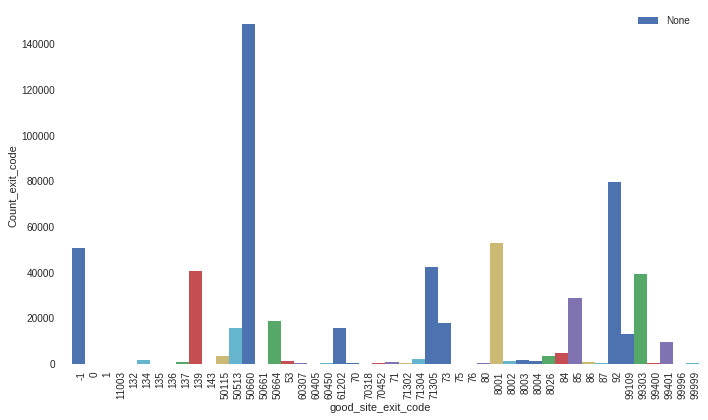

In [0]:
# plot the total number of instances for each exit code through all sites per workflow
exit_code_counts(data_index_reset, 'tables_good_sites', title='good')

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


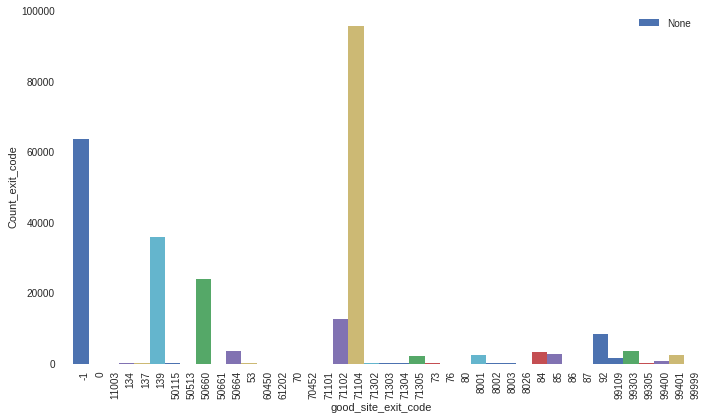

In [0]:
# plot the total number of instances for each exit code through all sites per workflow
exit_code_counts(data_index_reset, 'tables_bad_sites', title='good')

## Binary Classification

In [0]:
## Setup data for training and evaluation

#  features
#X = data_index_reset['tables_combined_sites_flatten'].tolist()

# target
#y = data_index_reset['action_label'].tolist()

In [0]:
## Setup data for training and evaluation

#  features
X = new_data.drop('binary_action', axis=1)#.values

# target
y = new_data['binary_action']#.values

In [0]:
# Perform train test split 70/30 split
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.20,
                                                    shuffle=True,
                                                    random_state=seed)

In [0]:
X_test.values[0]

array([ 3.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 15.,  0.,  0.,
        0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.])

In [0]:
list(set(new_data['binary_action'].values))

[0, 1]

In [0]:
X_train.columns

Index(['-1', '0', '1', '11003', '132', '134', '135', '136', '137', '139',
       '143', '50115', '50513', '50660', '50661', '50664', '53', '60307',
       '60405', '60450', '61202', '70', '70318', '70452', '71', '71101',
       '71102', '71104', '71302', '71303', '71304', '71305', '73', '75', '76',
       '80', '8001', '8002', '8003', '8004', '8026', '84', '85', '86', '87',
       '92', '99109', '99303', '99305', '99400', '99401', '99996', '99999'],
      dtype='object')

In [0]:
# Configure neural network architecture
#input_dim    = np.array(X).shape[1]
input_dim    = X.shape[1]
n_classes    = len(list(set(y)))
#n_classes    = y.reshape(-1,1).shape[1]
nlayers      = 3  
nneurons     = 53
l2_norm      = 0.0014677547170664112
dropout_rate = 0.014655354118727714
loss         = 'sparse_categorical_crossentropy'

default_parameters = [3, 53, 0.0014677547170664112, 0.014655354118727714]
print('input_dim', input_dim)
print('n_classes', n_classes)

# create model for use in scikit-learn
binary_pipe = {
    'kerasclassifier':  make_pipeline(scaler,
                                      KerasClassifier(build_fn=create_model,
                                                      input_dim=input_dim,
                                                      n_classes=n_classes,
                                                      nlayers=nlayers,
                                                      nneurons=nneurons,
                                                      dropout_rate=dropout_rate,
                                                      l2_norm=l2_norm,
                                                      loss=loss,
                                                      batch_size=256, 
                                                      epochs=35,
                                                      #validation_split=0.20,
                                                      #callbacks=[early_stopping],
                                                      verbose=1)),
    'xgboost':          make_pipeline(scaler, 
                                      xgboost.sklearn.XGBClassifier(n_estimators=10, #200,
                                                                    max_depth=1, #4,
                                                                    nthread=-1, 
                                                                    seed=42))
}

input_dim 53
n_classes 2


In [0]:
# Define Multilayer Perceptron architecture
def create_model(input_dim=53, n_classes = 13, nlayers=5, nneurons=100,
                 dropout_rate=0.0, l2_norm=0.001, learning_rate=1e-3,
                 activation='relu', kernel_initializer='lecun_normal',
                 optimizer='adam', metric=metrics.sparse_categorical_accuracy, 
                 loss='sparse_categorical_crossentropy'):
    '''
    create_model
    '''
        
    # create neural network model
    model = Sequential()
    
    # Add fully connected layer with an activation function (input layer)
    model.add(Dense(units=nneurons,
                    input_dim=input_dim,
                    kernel_initializer=kernel_initializer,
                    activation=activation,
                    kernel_regularizer=l2(l2_norm)))
    
    if dropout_rate != 0.:
        model.add(Dropout(dropout_rate))
                                        
    # Indicate the number of hidden layers
    for index, layer in enumerate(range(nlayers-1)):
        model.add(Dense(units=nneurons,
                        kernel_initializer=kernel_initializer,
                        activation=activation,
                        kernel_regularizer=l2(l2_norm)))
        
    # Add dropout layer
    if dropout_rate != 0.:
        model.add(Dropout(dropout_rate))
        
    # Add fully connected output layer with a sigmoid activation function
    model.add(Dense(n_classes,#1, #n_classes,
                    kernel_initializer=kernel_initializer,
                    activation='softmax',
                    kernel_regularizer=l2(l2_norm)))

    # Compile neural network (set loss and optimize)
    model.compile(loss=loss,#'binary_crossentropy',
                  #'sparse_categorical_crossentropy', 
                  #'binary_crossentropy', #loss,#'categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=['acc']) #'crossentropy'
    
    # Print summary report
    if True:
        model.summary()
    
    # Return compiled network
    return model

In [0]:
smote = SMOTE(ratio='minority', kind='svm', m_neighbors= 3, random_state=seed)
robusttscaler = RobustScaler() 
nn_keras = KerasClassifier(build_fn=create_model,
                           input_dim=input_dim,
                           n_classes=n_classes,
                           nlayers=nlayers,
                           nneurons=nneurons,
                           dropout_rate=dropout_rate,
                           l2_norm=l2_norm,
                           loss=loss,
                           batch_size=256,
                           epochs=35,
                           verbose=1)

In [0]:
 binary_pipe = { 'kerasclassifier' : Pipeline([
    ('smote', smote),
    ('robustscaler', robusttscaler),
    ('kerasclassifier', nn_keras)])
              }

In [0]:
pipeline = Pipeline([#('smote', smote), 
                     #('robusttscaler', robusttscaler), 
                     ('keras', nn_keras)])

In [0]:
#list(sorted(set(data_index_reset['target_label'])))

In [0]:
#pipeline.fit(np.array(X_train), np.array(y_train))
nn_keras.fit(X_train, y_train)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 53)                2862      
_________________________________________________________________
dropout_3 (Dropout)          (None, 53)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 53)                2862      
_________________________________________________________________
dense_7 (Dense)              (None, 53)                2862      
_________________________________________________________________
dropout_4 (Dropout)          (None, 53)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
_________________________________________________________________
Epoch 1/

In [0]:
#pipeline.fit(X_train, y_train)
X_test[0:][0]

KeyError: ignored

In [0]:
y_hat = pipeline.predict_proba(X_test)

# encode class values as integers
#from sklearn.preprocessing import LabelEncoder
#encoder = LabelEncoder()
#encoder.fit(y_train)
#y_hat = encoder.transform(y_hat)

1517/1517 [==============================] - 0s 55us/step


In [0]:
X_test.values[0]

array([ 3.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 15.,  0.,  0.,
        0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.])

In [0]:
y_hat = nn_keras.predict_probanp.array([[3.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,\
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 15.,  0.,  0.,\
        0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,\
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,\
        0.]]))

1/1 [==============================] - 0s 67ms/step


In [0]:
y_hat = nn_keras.predict_proba([ 3.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 15.,  0.,  0.,
        0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.])

ValueError: ignored

In [0]:
from sklearn.metrics import classification_report
print(classification_report(y_test, np.argmax(y_hat, 1)))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       167
           1       0.89      1.00      0.94      1350

   micro avg       0.89      0.89      0.89      1517
   macro avg       0.44      0.50      0.47      1517
weighted avg       0.79      0.89      0.84      1517



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Confusion matrix, without normalization
[[   0  167]
 [   0 1350]]


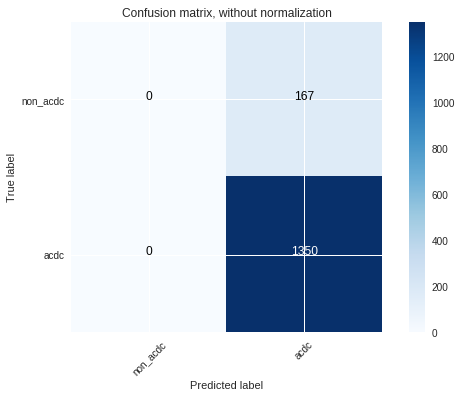

In [0]:
# Plot non-normalized confusion matrix
plotter.plot_confusion_matrix(y_test, np.argmax(y_hat, 1),
                              normalize=False, 
                              #classes=list(sorted(set(data_index_reset['target_action']))),
                              classes=['non_acdc', 'acdc'],
                              title='Confusion matrix, without normalization')

In [0]:
!pip install eli5

    100% |████████████████████████████████| 102kB 3.7MB/s 
    100% |████████████████████████████████| 51kB 17.2MB/s 
  Running setup.py bdist_wheel for tabulate ... - done
  Stored in directory: /root/.cache/pip/wheels/2a/85/33/2f6da85d5f10614cbe5a625eab3b3aebfdf43e7b857f25f829
Successfully built tabulate


In [0]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(nn_keras, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = exit_code_numbers)

1517/1517 [==============================] - 0s 13us/step


/usr/local/lib/python3.6/dist-packages/eli5/formatters/html.py:230: RuntimeWarning: invalid value encountered in double_scalars
  rel_weight = (abs(weight) / weight_range) ** 0.7


Weight,Feature
0 ± 0.0000,135
0 ± 0.0000,70452
0 ± 0.0000,70318
0 ± 0.0000,70
0 ± 0.0000,61202
0 ± 0.0000,60450
0 ± 0.0000,60405
0 ± 0.0000,60307
0 ± 0.0000,53
0 ± 0.0000,50664


In [0]:
!pip install shap

In [0]:
# Define Multilayer Perceptron architecture
def create_model(input_dim=54, n_classes = 13, nlayers=5, nneurons=100,
                 dropout_rate=0.0, l2_norm=0.001, learning_rate=1e-3,
                 activation='relu', kernel_initializer='lecun_normal',
                 optimizer='adam', metric=metrics.sparse_categorical_accuracy, 
                 loss='sparse_categorical_crossentropy'):
    '''
    create_model
    '''
        
    # create neural network model
    model = Sequential()
    
    # Add fully connected layer with an activation function (input layer)
    model.add(Dense(units=nneurons,
                    input_dim=input_dim,
                    kernel_initializer=kernel_initializer,
                    activation=activation,
                    kernel_regularizer=l2(l2_norm)))
    
    if dropout_rate != 0.:
        model.add(Dropout(dropout_rate))
                                        
    # Indicate the number of hidden layers
    for index, layer in enumerate(range(nlayers-1)):
        model.add(Dense(units=nneurons,
                        kernel_initializer=kernel_initializer,
                        activation=activation,
                        kernel_regularizer=l2(l2_norm)))
        
    # Add dropout layer
    if dropout_rate != 0.:
        model.add(Dropout(dropout_rate))
        
    # Add fully connected output layer with a sigmoid activation function
    model.add(Dense(n_classes,#1, #n_classes,
                    kernel_initializer=kernel_initializer,
                    activation='softmax',
                    kernel_regularizer=l2(l2_norm)))
 
    # Compile neural network (set loss and optimize)
    model.compile(loss=loss, #'binary_crossentropy', #loss,#'categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=[metric]) #'crossentropy'
    
    # Print summary report
    if True:
        model.summary()
    
    # Return compiled network
    return model

In [0]:
model = create_model(
      input_dim=X.shape[1],
      n_classes=len(list(set(y))),
      nlayers= 3,
      nneurons= 53,
      l2_norm=0.0014677547170664112,
      dropout_rate=0.014655354118727714,
      loss='sparse_categorical_crossentropy'
)

model.fit(X_train, y_train, epochs=35, batch_size=256)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 53)                2862      
_________________________________________________________________
dropout_5 (Dropout)          (None, 53)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_11 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_6 (Dropout)          (None, 53)                0         
_________________________________________________________________
dense_12 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
_________________________________________________________________
Epoch 1/

In [0]:
import shap

In [0]:
# load JS visualization code to notebook
shap.initjs()

# explain the model's predictions using SHAP values
explainer = shap.DeepExplainer(model, X_train)
shap_values = explainer.shap_values(X_test.values)


### plot the SHAP values for the class output of the first instance

In [0]:
# load JS visualization code to notebook
shap.initjs()

# visualize the first prediction's explanation
shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], X_test.iloc[0,:], link="logit")

In [0]:
# load JS visualization code to notebook
shap.initjs()

# plot the SHAP values for the class output of the first instance
shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], X_test.iloc[0,:])

In [0]:
# load JS visualization code to notebook
shap.initjs()

# plot the SHAP values for the class output of the first instance (wrong!)
#shap.force_plot(explainer.expected_value[0], shap_values[0][:,0], X_test.iloc[:,0])
shap.force_plot(explainer.expected_value[0], shap_values[0][0], X_test.iloc[0])

In [0]:
# load JS visualization code to notebook
shap.initjs()

# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.force_plot(explainer.expected_value[0], shap_values[0])

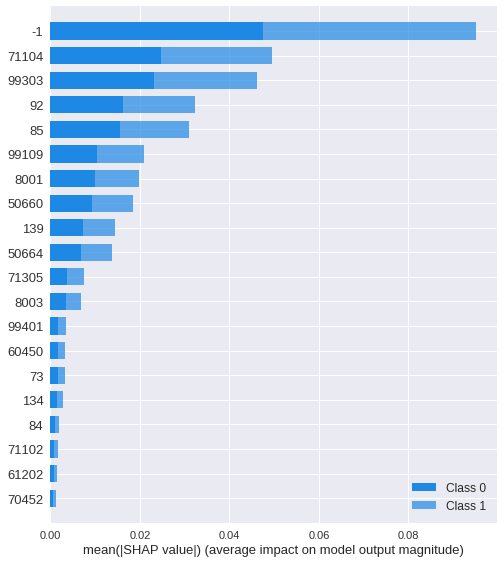

In [0]:
# load JS visualization code to notebook
shap.initjs()

#shap.dependence_plot("71104", shap_values, X_test)
shap.summary_plot(shap_values, X_test, feature_names=exit_code_numbers)

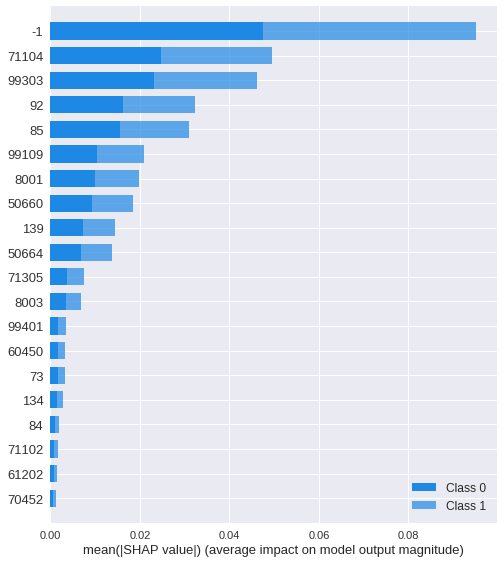

In [0]:
# load JS visualization code to notebook
shap.initjs()

# summarize the effects of all the features
shap.summary_plot(shap_values, X_test, feature_names=exit_code_numbers)

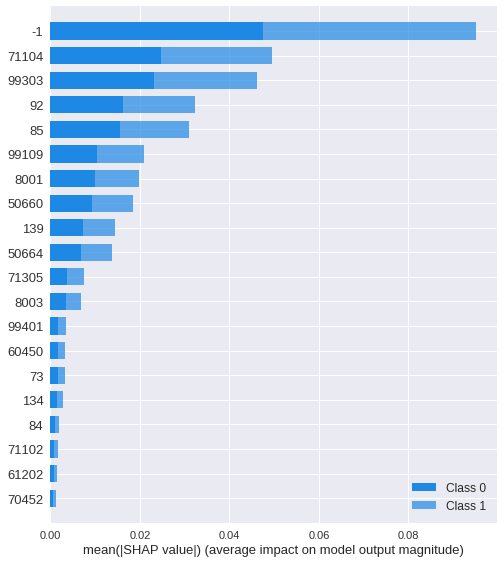

In [0]:
shap.summary_plot(shap_values, X_test, plot_type="bar", feature_names=exit_code_numbers)

If you don't supply an argument for interaction_index, Shapley uses some logic to pick one that may be interesting.

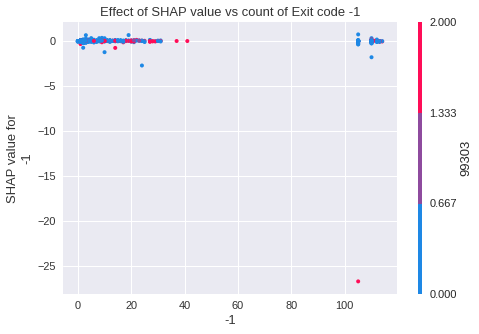

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='-1',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     interaction_index='auto', 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code -1", 
                     #show
                    )

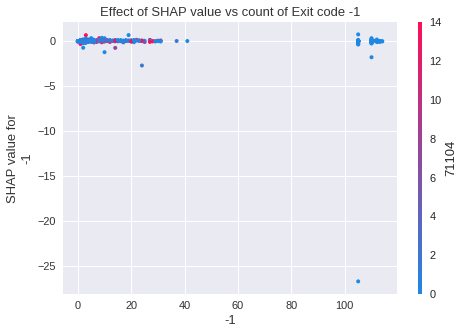

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='-1',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     interaction_index='71104', 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code -1", 
                     #show
                    )

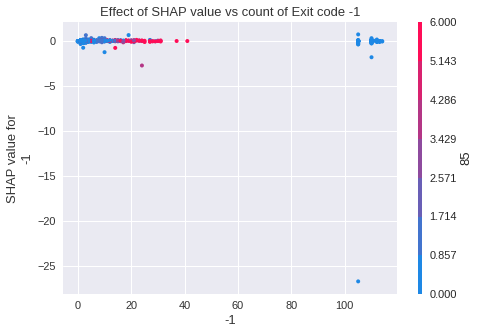

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='-1',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     interaction_index='85', 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code -1", 
                     #show
                    )

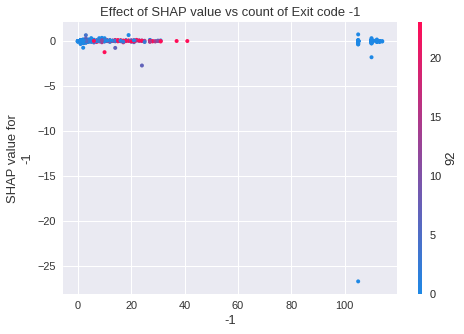

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='-1',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     interaction_index='92', 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code -1", 
                     #show
                    )

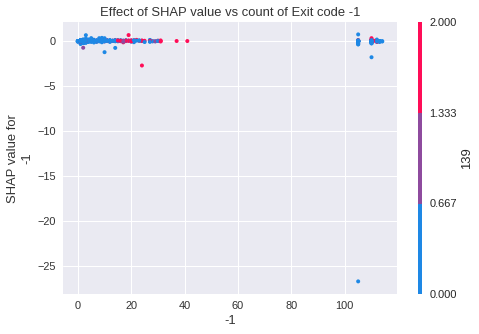

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='-1',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     interaction_index='139', 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code -1", 
                     #show
                    )

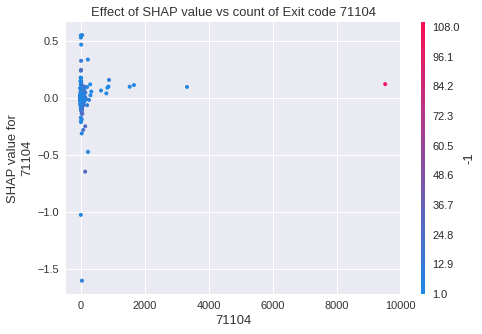

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='71104',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     #interaction_index, 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code 71104", 
                     #show
                    )

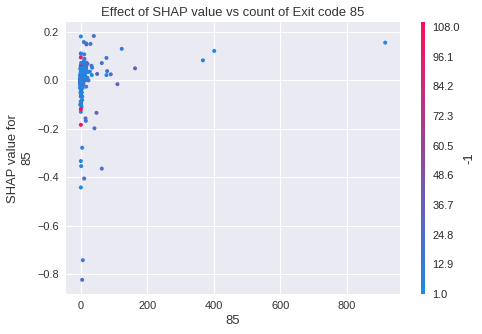

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='85',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     #interaction_index, 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code 85", 
                     #show
                    )

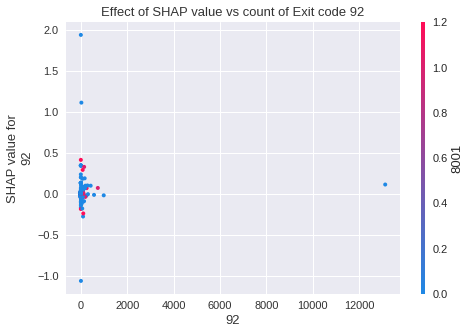

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='92',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     #interaction_index, 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code 92",  
                     #show
                    )

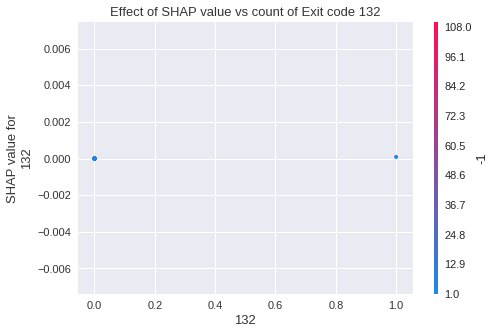

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='132',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     #interaction_index, 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code 132",  
                     #show
                    )

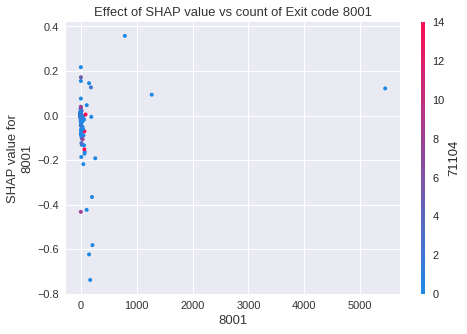

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='8001',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     #interaction_index, 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code 8001",  
                     #show
                    )

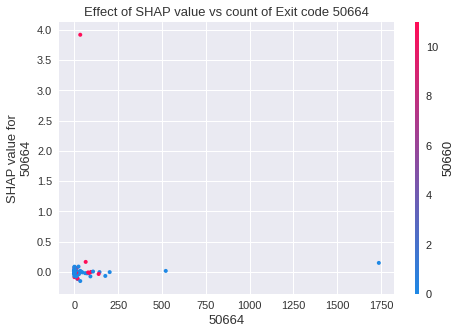

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='50664',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     #interaction_index, 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code 50664",  
                     #show
                    )

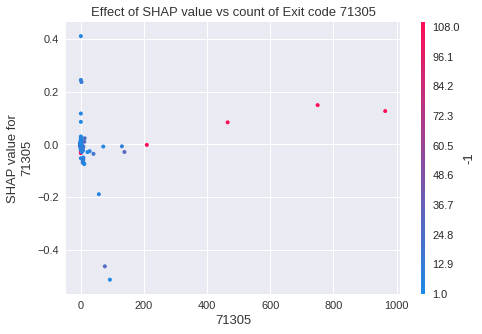

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='71305',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     #interaction_index, 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code 71305",  
                     #show
                    )

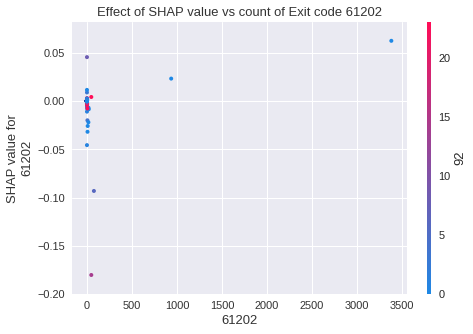

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='61202',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     #interaction_index, 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code 61202",  
                     #show
                    )

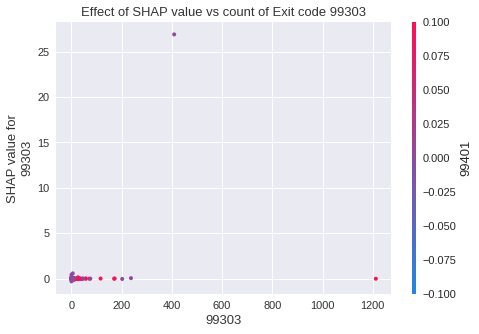

In [0]:
# load JS visualization code to notebook
shap.initjs()

shap.dependence_plot(ind='99303',
                     shap_values=shap_values[1], 
                     features=X_test, 
                     #feature_names=exit_code_numbers, 
                     #display_features, 
                     #interaction_index, 
                     #color, 
                     #axis_color, 
                     #dot_size, 
                     #alpha, 
                     title="Effect of SHAP value vs count of Exit code 99303", 
                     #show
                    )

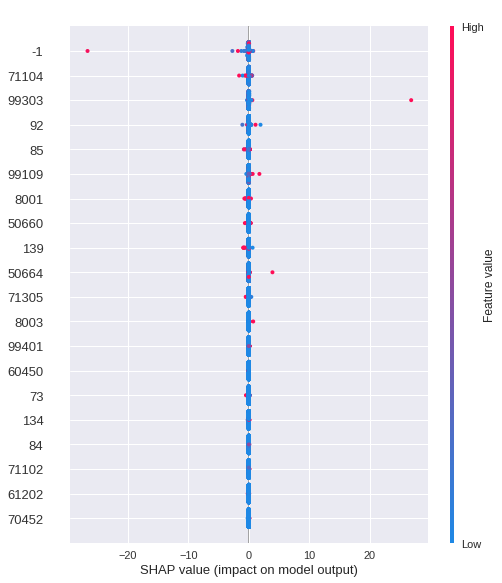

In [0]:
# load JS visualization code to notebook
shap.initjs()

# summarize the effects of all the features
shap.summary_plot(shap_values[1], X_test, feature_names=exit_code_numbers)

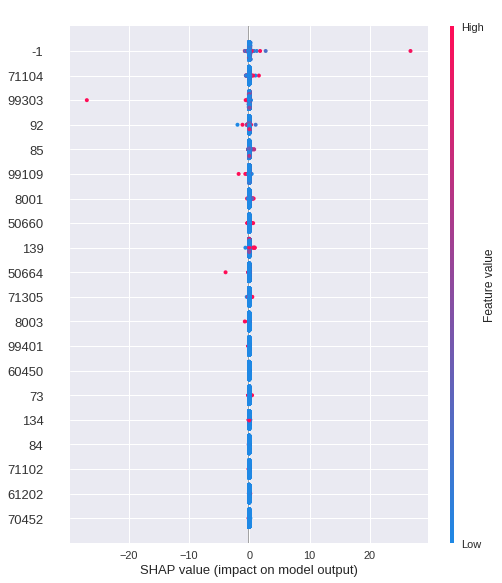

In [0]:
# summarize the effects of all the features
shap.summary_plot(shap_values[0], X_test, feature_names=exit_code_numbers)

Confusion matrix, without normalization
[[   4  163]
 [   5 1345]]


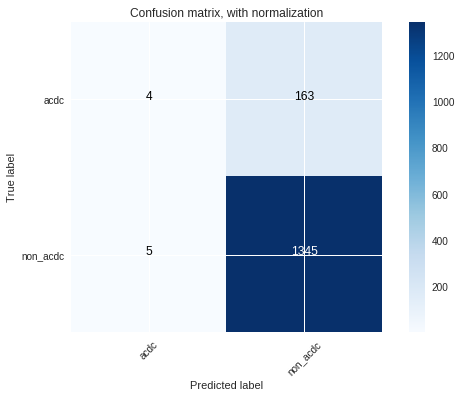

In [0]:
# Plot non-normalized confusion matrix
plotter.plot_confusion_matrix(y_test, np.argmax(y_hat, 1),
                              normalize=False, classes=['acdc', 'non_acdc'],
                              title='Confusion matrix, with normalization')


Building model ...


/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:


*************************************
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_13 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_7 (Dropout)          (None, 53)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_15 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_8 (Dropout)          (None, 53)                0         
_________________________________________________________________
dense_16 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
____________________________________

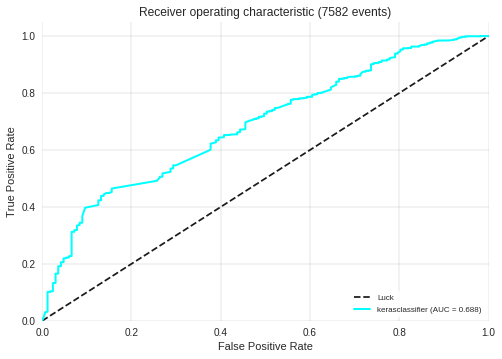

In [0]:
# Assessing a Classifier's Performance
roc_curve(binary_pipe,
          X_train,
          X_test,
          y_train,
          y_test
          )

/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:


*************************************
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_29 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_15 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_30 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_31 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_16 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_32 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
____________________________________

/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set 

*************************************
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_33 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_17 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_34 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_35 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_18 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_36 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
____________________________________

/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set 

*************************************
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_37 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_19 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_38 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_39 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_20 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_40 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
____________________________________

/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set 

*************************************
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_41 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_21 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_42 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_43 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_22 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_44 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
____________________________________

/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:752: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set 

*************************************
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_45 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_23 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_46 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_47 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_24 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
____________________________________

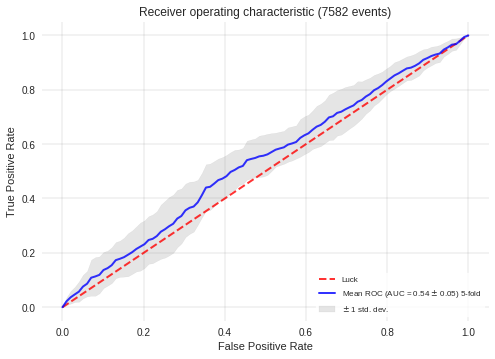

In [0]:
# Cross-validation ROC curve (15-folds)
roc_curve_cv(binary_pipe['kerasclassifier'], X, y, n_splits=5)

In [0]:
# Declare model instance
binary_model = binary_pipe['kerasclassifier']

In [0]:
# Fit model
binary_model.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:


*************************************
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_49 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_25 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_50 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_51 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_26 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_52 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
____________________________________

Pipeline(memory=None,
     steps=[('smote', SMOTE(k=None, k_neighbors=5, kind='svm', m=None, m_neighbors=3, n_jobs=1,
   out_step=0.5, random_state=42, ratio='minority', svm_estimator=None)), ('robustscaler', RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
       with_scaling=True)), ('kerasclassifier', <keras.wrappers.scikit_learn.KerasClassifier object at 0x7f2154792080>)])

## Model performance


In [0]:
# Predictions based on testing data
y_pred = binary_model.predict(X_test)

1517/1517 [==============================] - 0s 184us/step


In [0]:
# Probability predictions based on testing data
y_prob = binary_model.predict_proba(X_test)

1517/1517 [==============================] - 0s 10us/step


In [0]:
labels = sorted(list(set(y_test)))
print(labels)
print(len(labels))

[0, 1]
2


In [0]:
# Defined as the negative log-likelihood of the true labels and predictions
print('log_loss: ', log_loss(y_test, y_prob, labels=labels))
print('log_loss: ', log_loss(y_test, y_prob, labels=[0,1]))

log_loss:  0.5076484810473109
log_loss:  0.5076484810473109


In [0]:
# Evaluate test prediction according to accuracy
print('accuracy: ', accuracy_score(y_test, y_pred))

accuracy:  0.7402768622280818


In [0]:
# Evaluate traing prediction according to recall
# The recall is the ratio tp/(tp + fn) where tp is the number of true positives 
# and fn the number of false negatives. The recall is intuitively the ability 
# of the classifier to find all the positive samples.
# number of correctly predicted “positives” divided by the total number of “positives”.
print('recall: ', recall_score(y_test, y_pred, average='weighted'))

recall:  0.7402768622280818


In [0]:
# Evaluate traing prediction according to precision
# The precision is the ratio tp / (tp + fp) where tp is the number of true positives 
# and fp the number of false positives. The precision is intuitively the ability 
# of the classifier not to label as positive a sample that is negative
print('precision: ', precision_score(y_test, y_pred, average='weighted'))

precision:  0.8341919502291023


In [0]:
# F1-score corresponds to the harmonic mean of precision and recal
print('f1-score: ', f1_score(y_test, y_pred, average='weighted'))

f1-score:  0.7781362573455188


In [0]:
# Calculate metrics for each label, and find their average, weighted by support 
# (the number of true instances for each label). This alters ‘macro’ to account 
# for label imbalance; it can result in an F-score that is not between precision and recall.
print(geometric_mean_score(y_test, y_pred, average='weighted'))

0.576136204243482


In [0]:
# Classify and report the results
print(classification_report_imbalanced(y_test, y_pred))

                   pre       rec       spe        f1       geo       iba       sup

          0       0.19      0.41      0.78      0.26      0.56      0.31       167
          1       0.91      0.78      0.41      0.84      0.56      0.33      1350

avg / total       0.83      0.74      0.45      0.78      0.56      0.33      1517



In [0]:
# Defined as the negative log-likelihood of the training true labels and predictions
print('log_loss: ', log_loss(y_train, binary_model.predict_proba(X_train)))

6065/6065 [==============================] - 0s 6us/step
log_loss:  0.49913669255177284


In [0]:
# Evaluate training prediction according to accuracy
print('accuracy: ', accuracy_score(y_train, binary_model.predict(X_train)))

6065/6065 [==============================] - 0s 6us/step
accuracy:  0.7531739488870569


Confusion matrix, without normalization
[[  68   99]
 [ 295 1055]]


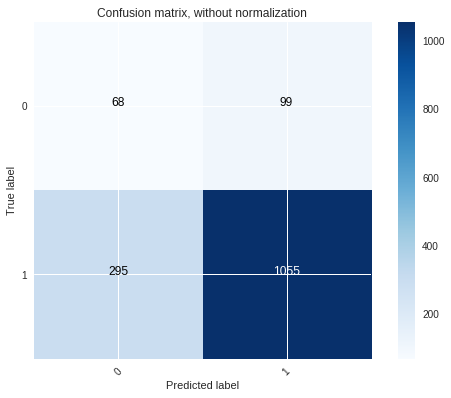

In [0]:
# Plot non-normalized confusion matrix
plotter.plot_confusion_matrix(y_test, y_pred,
                              normalize=False, classes=labels,
                              title='Confusion matrix, without normalization')

Normalized confusion matrix
[[0.41 0.59]
 [0.22 0.78]]


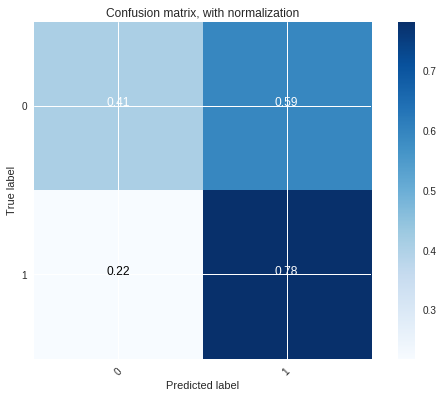

In [0]:
# Plot with-normalized confusion matrix
plotter.plot_confusion_matrix(y_test, y_pred,
                              normalize=True, classes=labels,
                              title='Confusion matrix, with normalization')


Building model ...


/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:


*************************************
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_53 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_27 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_54 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_55 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_28 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_56 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
____________________________________

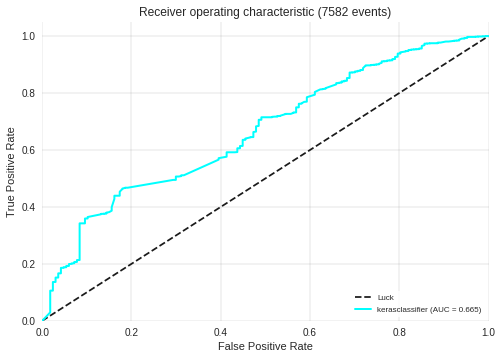

In [0]:
# Assessing a Classifier's Performance
roc_curve(binary_pipe,
          X_train,
          X_test,
          y_train,
          y_test
          )

In [0]:
# Cross-validation ROC curve (15-folds)
roc_curve_cv(binary_model, X, y, n_splits=10)

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/imblearn/pipeline.py:190: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if memory.cachedir is None:


*************************************
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_61 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_31 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_62 (Dense)             (None, 53)                2862      
_________________________________________________________________
dense_63 (Dense)             (None, 53)                2862      
_________________________________________________________________
dropout_32 (Dropout)         (None, 53)                0         
_________________________________________________________________
dense_64 (Dense)             (None, 2)                 108       
Total params: 8,694
Trainable params: 8,694
Non-trainable params: 0
____________________________________

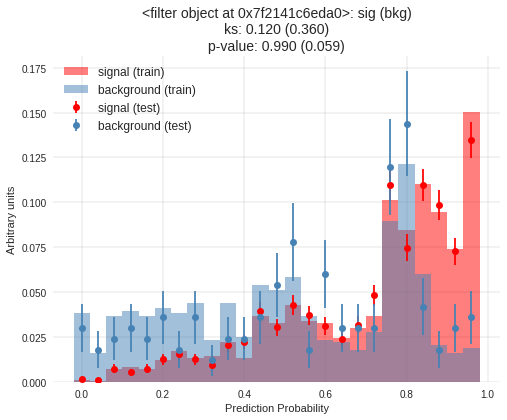

In [0]:
overfitting(binary_pipe['kerasclassifier'],
            X_train,
            X_test,
            y_train,
            y_test,
            bins=25)

In [0]:
# build scikit-learn scoring metric for f1-score
f1_scoring = make_scorer(f1_score_objective, greater_is_better=True, needs_proba=False)

## XGBoost modeling



In [0]:
def modelfit(alg, dtrain, predictors, 
             useTrainCV=True, cv_folds=5, 
             early_stopping_rounds=50, eval_metric=f1_scoring):
    
    
    print(dtrain.shape)
    print(predictors.shape)
    if useTrainCV:
        xgb_param = alg.named_steps['xgbclassifier'].get_xgb_params()
        # To load a numpy array into DMatrix
        #xgtrain = xgb.DMatrix(dtrain[predictors].values, label=dtrain[target].values)
        xgtrain = xgboost.DMatrix(data=dtrain, label=predictors)
        print('START')
        cvresult = xgboost.cv(xgb_param, xgtrain, 
                              num_boost_round=alg.named_steps['xgbclassifier'].get_params()['n_estimators'], 
                              nfold=cv_folds,
                              #metrics=f1_scoring, 
                              #early_stopping_rounds=early_stopping_rounds, 
                              #show_progress=False
                             )
        print('END')
        alg.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    #alg.fit(dtrain[predictors], dtrain['Disbursed'],eval_metric='auc')
    alg.fit(dtrain, predictors, eval_metric=eval_metric)
        
    #Predict training set:
    #dtrain_predictions = alg.predict(dtrain[predictors])
    dtrain_predictions = alg.predict(dtrain)
    #dtrain_predprob = alg.predict_proba(dtrain[predictors])[:,1]
    dtrain_predprob = alg.predict_proba(predictors)[:,1]
        
    #Print model report:
    print("\nModel Report")
    #print("Accuracy: %.4g" % metrics.accuracy_score(dtrain['Disbursed'].values, dtrain_predictions))
    print("Model Accuracy: %.4g" % metrics.accuracy_score(predictors, dtrain_predictions))
    #print("AUC Score (Train): %f" % metrics.roc_auc_score(dtrain['Disbursed'], dtrain_predprob))
    print("AUC Score (Train): %f" % metrics.roc_auc_score(predictors, dtrain_predprob))
                    
    feat_imp = pd.Series(alg.get_booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')
    
    return plt.show

In [0]:
def train_validate_test_split(df, train_percent=.6, validate_percent=.2, seed=42):
  
  np.random.seed(seed)
  perm = np.random.permutation(df.index)
  m = len(df.index)

  train_end = int(train_percent * m)
  validate_end = int(validate_percent * m) + train_end

  train = df.ix[perm[:train_end]]
  validate = df.ix[perm[train_end:validate_end]]
  test = df.ix[perm[validate_end:]]

  return train, validate, test

In [0]:
train, valid, test = train_validate_test_split(data_index_reset)

In [0]:
# XGboost estimator
classifier = binary_pipe['xgboost']

In [0]:
# Fit model to training data
classifier.fit(np.array(X_train), np.array(y_train))

# Training with early stopping
eval_set  = [(train, y_train), (valid, y_valid)]

classifier.fit(train, y_train, 
               eval_set=eval_set,
               eval_metric="auc", 
               early_stopping_rounds=30)

In [0]:
# Evaluation
predictions = classifier.predict(np.array(X_test))

In [0]:
#pd.DataFrame(predictions, index=X_test.index, columns=['Predicted default']).head()
pd.DataFrame(predictions, columns=['Predicted default']).head()

In [0]:
print("Model Accuray: {:.2f}%".format(100*classifier.score(X_test, y_test)))

In [0]:
# model characteristics
print("Number of boosting trees: {}".format(classifier.named_steps['xgbclassifier'].n_estimators))
print("Max depth of trees: {}".format(classifier.named_steps['xgbclassifier'].max_depth))
print("Objective function: {}".format(classifier.named_steps['xgbclassifier'].objective))

In [0]:
plt.figure(figsize=(50,45))
xgboost.plot_importance(classifier.named_steps['xgbclassifier'], ax=plt.gca())
plt.plot()

In [0]:
# Feature importance
importances = classifier.get_fscore() # Or clf..get_booster().get_fscore()

importance_frame = pd.DataFrame({'Importance': list(importances.values()), 'Feature': list(importances.keys())})
importance_frame.sort_values(by = 'Importance', inplace = True)
importance_frame.plot(kind = 'barh', x = 'Feature', figsize = (8,8), color = 'orange')

In [0]:
plt.figure(figsize=(20,15))

xgboost.plot_tree(classifier.named_steps['xgbclassifier'], 
                  num_trees=2,
                  ax=plt.gca()
                 )
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(150, 100)
fig.savefig('tree.png')

#plt.show()

In [0]:
# Plot non-normalized confusion matrix
plotter.plot_confusion_matrix(y_test, predictions,
                              normalize=False, classes=list(set(y_test)),
                              title='Confusion matrix, without normalization')

In [0]:
# Plot normalized confusion matrix
plotter.plot_confusion_matrix(y_test, predictions,
                              normalize=True, classes=list(set(y_test)),
                              title='Confusion matrix, without normalization')

In [0]:
# Assessing a Classifier's Performance
roc_curve(binary_pipe,
          np.array(X_train),
          np.array(X_test),
          np.array(y_train),
          np.array(y_test)
          )

In [0]:
# Cross-validation ROC curve (15-folds)
roc_curve_cv(.named_steps['xgbclassifier']classifier, 
             np.array(X), 
             np.array(y).reshape(-1,), 
             n_splits=15)

In [0]:
from sklearn.preprocessing import LabelEncoder

# specify parameters via map
param = {
    # Parameters that we are going to tune.
    'max_depth':2, 
    'eta':1, 
    'silent':1, 
    # Other parameters
    'objective':'binary:logistic' #'gpu:binary:logistic'
} 
num_round = 2

# encode string class values as integers
#label_encoder = LabelEncoder()
#y_train_encoded = label_encoder.fit_transform(y_train)
#y_test_encoded = label_encoder.transform(y_test)

#dtrain = xgb.DMatrix(np.array(X_train), label=np.array(y_train_encoded))
#dtest  = xgb.DMatrix(np.array(X_test), label=np.array(y_test_encoded))

In [0]:
# fit xgboost algo
#bst = xgb.train(param, dtrain, num_round)

In [0]:
# make prediction
#preds = bst.predict(dtest)

In [0]:
# encode string class values as integers
label_encoder = LabelEncoder()
label_encoder = label_encoder.fit(y_train)
y_train_encoded = label_encoder.transform(y_train)

y_test_encoded = label_encoder.transform(y_test)

In [0]:
overfitting(classifier,
            np.array(X_train),
            np.array(X_test),
            np.array(y_train),
            np.array(y_test),
            bins=50)

## Multicalss classification

In [0]:
## Setup data for training and evaluation

#  features
X = data_index_reset['tables_combined_sites_flatten'].tolist()

# target
y = data_index_reset['target_encoded'].tolist()

In [0]:
data_index_reset.head(2)

In [0]:
# Perform train test split 70/30 split
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.30,
                                                    shuffle=True,
                                                    random_state=seed)

In [0]:
smote = SMOTE(ratio='minority', kind='svm', m_neighbors= 3, random_state=seed)
robusttscaler = RobustScaler() 

In [0]:
#xgbclassifier = xgboost.sklearn.XGBClassifier(n_estimators=100,
#                                              max_depth=4,
#                                              nthread=-1,
#                                              seed=42)

In [0]:
multiclass_pipe = {
 ('kears', keras)   
}

In [0]:
#multiclass_pipe = { 
#    'xgboost' : Pipeline([
#        #('smote', smote),
#         ('robustscaler', robusttscaler),
#        ('xgbclassifier', xgbclassifier)])
#                }

#num_class

multiclass_pipe = { 
    'xgboost' : Pipeline([('robustscaler', robusttscaler), 
                          ('xgbclassifier', xgboost.sklearn.XGBClassifier(learning_rate =0.1,
                                                                          n_estimators=10,
                                                                          max_depth=5,
                                                                          #min_child_weight=1,
                                                                          gamma=0,
                                                                          #subsample=0.8,
                                                                          #colsample_bytree=0.8,
                                                                          objective='multi:softprob',
                                                                          #scale_pos_weight=1, #Balancing of positive and negative weights.

                                                                          num_class=len(list(set(y_train))),
                                                                          #nthread=-1,
                                                                          seed=seed))
                         ])
}

In [0]:
multiclass_model = multiclass_pipe['xgboost']

In [0]:
print(np.array(X_train).shape)
print(np.array(y_train).shape)
print(np.array(X_test).shape)
print(np.array(y_test).shape)

In [0]:
#%%time
#multiclass_model.fit(np.array(X_train), np.array(y_train))
modelfit(multiclass_model, np.array(X_train), np.array(y_train))

In [0]:
y_pred = multiclass_model.predict(np.array(X_test))
y_prob = multiclass_model.predict_proba(np.array(X_test))

In [0]:
# Plot non-normalized confusion matrix
plotter.plot_confusion_matrix(y_test, y_pred,
                              normalize=False, classes=list(set(y_test)),
                              title='Confusion matrix, without normalization')

In [0]:
# Plot non-normalized confusion matrix
plotter.plot_confusion_matrix(y_test, y_pred,
                              normalize=True, classes=list(set(y_test)),
                              title='Confusion matrix, with normalization')

In [0]:
# model characteristics
print("Number of boosting trees: {}".format(multiclass_model.named_steps['xgbclassifier'].n_estimators))
print("Max depth of trees: {}".format(multiclass_model.named_steps['xgbclassifier'].max_depth))
print("Objective function: {}".format(multiclass_model.named_steps['xgbclassifier'].objective))

In [0]:
plt.figure(figsize=(50,45))
xgboost.plot_importance(multiclass_model.named_steps['xgbclassifier'], ax=plt.gca())
plt.plot()

In [0]:
dtrain = xgboost.DMatrix(data=X_train, label=y_train)
dtest = xgboost.DMatrix(data=X_test, label=y_test)

In [0]:
params = {
    # Parameters that we are going to tune.
    'max_depth':6,
    'min_child_weight': 1,
    'eta':.3,
    'subsample': 1,
    'colsample_bytree': 1,
    # Other parameters
    'objective':'multi:softprob',
}

In [0]:
params['eval_metric'] = "auc"
num_boost_round = 1000

In [0]:
model = xgb.train(
    params,
    dtrain,
    num_boost_round=num_boost_round,
    evals=[(dtest, "Test")],
    early_stopping_rounds=10
)

In [0]:
print("Best AUC: {:.2f} with {} rounds".format(
                 model.best_score,
                 model.best_iteration+1))

In [0]:
cv_results = xgb.cv(
    params,
    dtrain,
    num_boost_round=num_boost_round,
    seed=42,
    nfold=5,
    metrics={'auc'},
    early_stopping_rounds=10
)

cv_results

In [0]:
print(cv_results['test-auc-mean'].min())
print(cv_results['test-auc-mean'].max())

In [0]:
# You can try wider intervals with a larger step between
# each value and then narrow it down. Here after several
# iteration I found that the optimal value was in the
# following ranges.
gridsearch_params = [
    (max_depth, min_child_weight)
    for max_depth in range(9,12)
    for min_child_weight in range(5,8)
]

In [0]:
# Define initial best params and MAE
min_mae = float("Inf")
best_params = None
for max_depth, min_child_weight in gridsearch_params:
    print("CV with max_depth={}, min_child_weight={}".format(
                             max_depth,
                             min_child_weight))

    # Update our parameters
    params['max_depth'] = max_depth
    params['min_child_weight'] = min_child_weight

    # Run CV
    cv_results = xgb.cv(
        params,
        dtrain,
        num_boost_round=num_boost_round,
        seed=42,
        nfold=5,
        metrics={'mae'},
        early_stopping_rounds=10
    )

    # Update best MAE
    mean_mae = cv_results['test-mae-mean'].min()
    boost_rounds = cv_results['test-mae-mean'].argmin()
    print("\tMAE {} for {} rounds".format(mean_mae, boost_rounds))
    if mean_mae < min_mae:
        min_mae = mean_mae
        best_params = (max_depth,min_child_weight)

print("Best params: {}, {}, MAE: {}".format(best_params[0], best_params[1], min_mae))

We get the best score with a max_depth of 10 and min_child_weight of 6, so let's update our params

In [0]:
params['max_depth'] = 10
params['min_child_weight'] = 6

## Apply resampling 

In [0]:
from imblearn import pipeline as pl

RANDOM_STATE = 42
smote = os.SMOTE(random_state=RANDOM_STATE)

pipeline = pl.make_pipeline(smote, cart)

In [0]:
# Source:
#   - https://github.com/keras-team/keras/issues/2115
#   - https://github.com/keras-team/keras/issues/6218

# Custom loss function with costs

def w_categorical_crossentropy(y_true, y_pred, weights):
    nb_cl = len(weights)
    final_mask = K.zeros_like(y_pred[:, 0])
    y_pred_max = K.max(y_pred, axis=1)
    y_pred_max = K.reshape(y_pred_max, (K.shape(y_pred)[0], 1))
    y_pred_max_mat = K.equal(y_pred, y_pred_max)
    for c_p, c_t in product(range(nb_cl), range(nb_cl)):
        final_mask += (weights[c_t, c_p] * y_pred_max_mat[:, c_p] * y_true[:, c_t])
    return K.categorical_crossentropy(y_pred, y_true) * final_mask
  
def weighted_categorical_crossentropy(y_true, y_pred, weights):
    nb_cl = len(weights)
    final_mask = K.zeros_like(y_pred[:, 0])
    y_pred_max = K.max(y_pred, axis=1)
    y_pred_max = K.reshape(y_pred_max, (y_pred.shape[0], 1))
    y_pred_max_mat = K.equal(y_pred, y_pred_max)
    for c_p, c_t in product(range(nb_cl), range(nb_cl)):
        final_mask += (weights[c_t, c_p] * y_pred_max_mat[:, c_p] * y_true[:, c_t])
    return K.categorical_crossentropy(y_pred, y_true) * final_mask
  
  
def tf_weighted_categorical_crossentropy(y_true, y_pred, weights):
    nb_cl = len(weights)
    final_mask = K.zeros_like(y_pred[:, 0])
    y_pred_max = K.max(y_pred, axis=1)
    y_pred_max = tf.expand_dims(y_pred_max, 1)
    y_pred_max_mat = K.equal(y_pred, y_pred_max)
    for c_p, c_t in product(range(nb_cl), range(nb_cl)):

        final_mask += (K.cast(weights[c_t, c_p],K.floatx()) * K.cast(y_pred_max_mat[:, c_p] ,K.floatx())* K.cast(y_true[:, c_t],K.floatx()))
    return K.categorical_crossentropy(y_pred, y_true) * final_mask
  
  
def weight_categorical_crossentropy(y_true, y_pred, weights):
    nb_cl = len(weights)
    final_mask = K.zeros_like(y_pred[:, 0])
    y_pred_max = K.max(y_pred, axis=1)
    y_pred_max = K.expand_dims(y_pred_max, 1)
    y_pred_max_mat = K.equal(y_pred, y_pred_max)
    for c_p, c_t in product(range(nb_cl), range(nb_cl)):

        final_mask += (K.cast(weights[c_t, c_p],K.floatx()) * K.cast(y_pred_max_mat[:, c_p] ,K.floatx())* K.cast(y_true[:, c_t],K.floatx()))
    return K.categorical_crossentropy(y_pred, y_true) * final_mask
w_array = np.ones((3,3))
w_array[2,1] = 1.2
w_array[1,2] = 1.2
ncce = partial(weight_categorical_crossentropy, weights=w_array)
ncce.__name__ ='weight_categorical_crossentropy'

# Fit neural network with 10 classes (no problem using custom loss function)

nb_classes = 10
wcc = w_categorical_crossentropy(np.ones((nb_classes, nb_classes)))

## Learning from model interpretation appproach

In [0]:
data_index_reset['tables_bad_sites'][0].T.columns

In [0]:
new_data = data_index_reset['tables_bad_sites'].apply(lambda x: x.T.sum())

In [0]:
data_index_reset['tables_bad_sites'][20]

In [0]:
new_data.head(10)

In [0]:
## Setup data for training and evaluation

#  features
X = new_data#.tolist()

# target
y = data_index_reset['action_encoded']#.tolist()

In [0]:
# Perform train test split 70/30 split
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.30,
                                                    shuffle=True,
                                                    random_state=seed)

In [0]:
# create model
model = xgboost.train({"learning_rate": 0.01}, 
                      xgboost.DMatrix(X_train, label=y_train), 
                      100,
                      #pred_contribs=True,
                      #pred_interactions=True
                     )

In [0]:
# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

In [0]:
# load JS in order to use some of the plotting functions from the shap
# package in the notebook
shap.initjs()


# visualize the first prediction's explanation
shap.force_plot(explainer.expected_value, shap_values[200,:], X_test.iloc[200,:])

**SHAP Summary Plot**

Use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. 

In [0]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X_test)

**Bar chart of mean importance**

This takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.


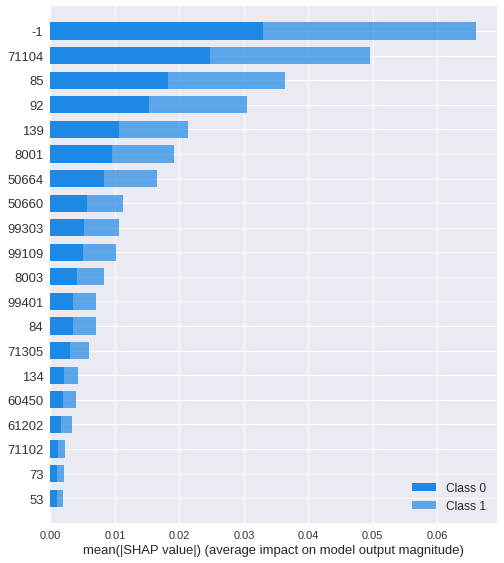

In [0]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

In [0]:
# load JS in order to use some of the plotting functions from the shap
# package in the notebook
shap.initjs()

# plot the SHAP values for the signal output of all instances
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test, link="logit")

**SHAP Interaction Values Plot**

Note that when there are no interactions present the SHAP interaction values are just a diagonal matrix with the SHAP values on the diagonal.

In [0]:
shap_interaction_values = explainer.shap_interaction_values(X_test)

AttributeError: ignored

In [0]:
#shap.TreeExplainer(model).shap_interaction_values(X_test) #, pred_interactions=True

In [0]:
X_train.head()

In [0]:
y_train.head()

In [0]:
model = xgboost.XGBClassifier(objective="binary:logistic", max_depth=4, n_estimators=10)
model.fit(X_train, y_train)

**SHAP dependence plots **

show the effect of a single feature across the whole dataset. They plot a feature's value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature is chosen for coloring to highlight possible interactions.

In [0]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X_test, display_features=X_test)

AttributeError: ignored

In [0]:
data_index_reset['target_label'].head()

In [0]:
## Setup data for training and evaluation

#  features
X = np.array(data_index_reset['tables_combined_sites_flatten'].tolist())

# target
#y = np.array(data_index_reset['target_label'].tolist())
y = np.array(data_index_reset['target_encoded'].tolist())

In [0]:
#  features
#X = new_data.tolist()

# target
#y = data_index_reset['action_encoded']#.tolist()

# target
#y = data_index_reset['target_label']#.tolist()#['target_encoded'].tolist()

In [0]:
# Perform train test split 70/30 split
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.30,
                                                    shuffle=True,
                                                    random_state=seed)

In [0]:
data_index_reset['target_encoded'].head()

In [0]:
#data_index_reset.head(15)

In [0]:
# Configure neural network architecture
input_dim    = np.array(X).shape[1]
n_classes    = len(list(set(y)))
nlayers      = 3  
nneurons     = 51
l2_norm      = 0.0014677547170664112
dropout_rate = 0.014655354118727714
loss         = 'sparse_categorical_crossentropy'

default_parameters = [3, 51, 0.0014677547170664112, 0.014655354118727714]
print('input_dim', input_dim)
print('n_classes', n_classes)

robusttscaler = RobustScaler() 
keras = KerasClassifier(build_fn=create_model,
                        input_dim=input_dim,
                        n_classes=n_classes,
                        nlayers=nlayers,
                        nneurons=nneurons,
                        dropout_rate=dropout_rate,
                        loss=loss,
                        batch_size=256,
                        epochs=35,
                        verbose=1)

In [0]:
nn_keras.fit(X_train, y_train)

In [0]:
model = nn_keras

## Finalize Model with pickle by saving and loading



In [0]:
import pickle

# save the model to disk
filename = 'finalized_model_pickle.sav'
file_handler = open(filename, 'wb')
pickle.dump(model, file_handler, protocol=-1)

In [0]:
pickle.dump(model, file_handler)

In [0]:
# some time later...
 
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test, Y_test)
print(result)

In [0]:
from sklearn.externals import joblib

# save the model to disk
filename = 'finalized_model_joblib.sav'
joblib.dump(model, filename)
 
# some time later...
 
# load the model from disk
loaded_model = joblib.load(filename)
result = loaded_model.score(X_test, Y_test)
print(result)

In [0]:
# Saving/loading whole models (architecture + weights + optimizer state)
from keras.models import load_model

model = nn_keras

model.model.save('nn_model.h5')  # creates a HDF5 file 'my_model.h5'
del model  # deletes the existing model

# returns a compiled model
# identical to the previous one
#model = load_model('nn_model.h5')

# Saving/loading only a model's architecture

# save as JSON
#json_string = model.to_json()

# model reconstruction from JSON:
from keras.models import model_from_json
#model = model_from_json(json_string)


# Saving/loading only a model's weights
#model.save_weights('nn_model_weights.h5')

#model.load_weights('nn_model_weights.h5')

#model.load_weights('nn_model_weights.h5', by_name=True)

In [0]:
!ls 

adc.json	     history.180223.json  nn_model.h5
history_180223.json  history.180412.json  sample_data


In [0]:
### Downloading files to your local file system

from google.colab import files

#with open('nn_model_weights.h5', 'w') as f:
#  f.write('some content')

files.download('nn_model.h5')

In [0]:
type(model)

In [0]:
# some time later...
 
# load the model from disk
#loaded_model = joblib.load(filename)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              #metrics=['accuracy']
             )

score = model.evaluate(X_test, y_test, batch_size=128)
print(np.mean(score))

In [0]:
def build_by_loading():
    model = load_model('nn_model.h5')
    return model 

In [0]:
nn_model = KerasClassifier(build_fn=build_by_loading, 
                            nb_epoch=10, 
                            batch_size=5, 
                            verbose=1)
print(type(nn_model))
nn_model.fit(X_train, y_train)

  

In [0]:
y_pred = nn_model.predict(np.array(X_test))
y_prob = nn_model.predict_proba(np.array(X_test))

In [0]:
list(sorted(set(y_test)))

In [0]:
# Plot non-normalized confusion matrix
plotter.plot_confusion_matrix(y_test, y_pred,
                              normalize=False, 
                              classes=list(sorted(set(y_test))),                     
                              title='Confusion matrix, without normalization')